In [1]:
import os
import abc
import json
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
import tensorflow as tf
import time

from sklearn import metrics
from tqdm import tqdm

In [2]:
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
class AbstractLayer(tf.keras.layers.Layer):
    """Abstract Layer."""
    
    def __init__(self):
        """Inits the class."""
        super(AbstractLayer, self).__init__()
    
    @abc.abstractmethod
    def call(self, inputs):
        """Makes forward pass of the layer."""
        pass


class AbstractModel(tf.keras.Model):
    """Abstract model."""

    def __init__(self):
        """Inits the class."""
        super(AbstractModel, self).__init__()

    @abc.abstractmethod
    def call(self, inputs, training=False):
        """Makes forward pass of the network."""
        pass

    @abc.abstractmethod
    def fit(self, **kwargs):
        """Fits the model.

        Replaces original fit method.
        
        More information can be found in documentation:
        https://www.tensorflow.org/guide/eager
        https://www.tensorflow.org/guide/autodiff
        """
        pass

    @abc.abstractmethod
    def predict(self, x):
        """Predicts x"""
        pass

In [4]:
def get_data(dataset_path='dataset.pkl', new_image_size=[64, 64]):
    with open(dataset_path, 'rb') as f:
        dataset = pickle.load(f)

    x_train = dataset['train']['X']
    y_train = dataset['train']['y']
    x_test = dataset['test']['X']
    y_test = dataset['test']['y']
    labels_mapping = dataset['labels_mapping']

    # Ustawienie ziarna
    tf.random.set_seed(1234)

    # Zmiana rozmiaru obrazu z 224x224
    x_train = tf.image.resize(
        x_train, new_image_size, 
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR, 
        preserve_aspect_ratio=False,
        name=None
    )

    x_test = tf.image.resize(
        x_test, new_image_size, 
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR, 
        preserve_aspect_ratio=False,
        name=None
    )

    # Zmiana typu obrazów z int na float i normalizacja wartości pikseli z przedziału           0-255 do przedziału 0-1
    # change tensor data type to float
    x_train = tf.cast(x_train, tf.float32) / 255.0
    x_test = tf.cast(x_test, tf.float32) / 255.0

    x_train = tf.reshape(x_train, [-1, 12288])
    x_test = tf.reshape(x_test, [-1, 12288])
    y_train = tf.reshape(y_train, [-1, 1])
    y_test = tf.reshape(y_test, [-1, 1])

    return x_train, y_train, x_test, y_test, labels_mapping


def get_train_ds(x, y, batch_size):
    train_ds = tf.data.Dataset.from_tensor_slices((x, y)) 
    train_ds = train_ds.shuffle(buffer_size=len(x)).batch(batch_size=batch_size)
    return train_ds


def save_results(data, name):
    path = f'{os.getcwd()}/results/{name}.json'
    with open(path, 'w') as fout:
        json.dump(data, fout, indent=1)

def read_results(name):
    path = f'{os.getcwd()}/results/{name}.json'
    with open(path, 'r') as file:
        data = json.load(file)
    return data

In [5]:
class BaseLayer(AbstractLayer):
    def __init__(self, output_dim, activation, init_w='random_uniform', init_b='random_uniform'):
        super(BaseLayer, self).__init__()
        self.output_dim = output_dim
        self.activation = activation
        self.init_w = init_w
        self.init_b = init_b

    def build(self, input_shape):
        self.w = self.add_weight(shape=[input_shape[-1], self.output_dim], initializer=self.init_w)
        self.b = self.add_weight(shape=[self.output_dim], initializer=self.init_b)

    def call(self, inputs):
        outputs = tf.matmul(inputs, self.w) + self.b
        return self.activation(outputs)

In [6]:
class BaseModel(AbstractModel):
    def __init__(self, **kwargs):
        super(BaseModel, self).__init__()
        init_w = kwargs.get('w', 'random_uniform')
        init_b = kwargs.get('b', 'glorot_uniform')
        self.layer_1 = BaseLayer(output_dim=256, activation=tf.keras.activations.relu, 
                                    init_w=init_w, init_b=init_b)
        self.layer_2 = BaseLayer(output_dim=14, activation=tf.keras.activations.softmax, 
                                    init_w=init_w, init_b=init_b)
    
    def call(self, inputs, training=False):
        outputs = self.layer_1(inputs)
        outputs = self.layer_2(outputs)
        return outputs

    def fit(self, **kwargs):
        self.train_loss = []
        self.train_fscore = []
        self.test_loss = []
        self.test_fscore = []
        self.per_epoch_time = []

        train_ds = kwargs['train_ds']
        x_test = kwargs['x_test']
        y_test = kwargs['y_test']
        cost_func = kwargs['cost_func']
        optimizer = kwargs['optimizer']
        learning_rate = kwargs['learning_rate']
        epochs = kwargs['epochs']

        optimizer = optimizer(learning_rate=learning_rate)
        
        for epoch in tqdm(range(epochs)):
            start_time = time.time()
            epoch_loss = []
            epoch_fscore = []

            for x, y in train_ds:
                with tf.GradientTape() as tape:
                    outputs = self.call(x)
                    loss = cost_func(y, outputs)
                    pred = tf.math.argmax(outputs, axis=1).numpy()
                
                grads = tape.gradient(loss, self.trainable_variables)
                optimizer.apply_gradients(zip(grads, self.trainable_variables))
                epoch_loss.append(loss)
                epoch_fscore.append(metrics.f1_score(tf.reshape(y, [-1]).numpy(), pred, average='weighted'))

            self.train_loss.append(sum(epoch_loss) / float(len(epoch_loss)))
            self.train_fscore.append(sum(epoch_fscore) / float(len(epoch_fscore)))
            self.test_loss.append(cost_func(y_test, self.call(x_test)))
            self.test_fscore.append(metrics.f1_score(y_test, self.predict(x_test), average='weighted'))
            self.per_epoch_time.append(time.time()-start_time)

    def predict(self, x):
        outputs = self(x)
        return tf.math.argmax(outputs, axis=1).numpy()

# TASK 1
## Init Params

In [7]:
x_train, y_train, x_test, y_test, labels_mapping = get_data()

In [12]:
batch_size = 100
optimizer = tf.keras.optimizers.Adam
learning_rate = 0.001
epochs = 25
cost_func = tf.keras.losses.SparseCategoricalCrossentropy()

initializers = ["random_uniform", "glorot_uniform", "random_normal"]

train_ds = get_train_ds(x_train, y_train, batch_size)

## 1A

In [26]:
results = []

for w in initializers:
    for b in initializers:
        model = BaseModel(w=w, b=b)
        model.fit(train_ds = train_ds, 
                    x_test = x_test,
                    y_test = y_test,
                    cost_func = cost_func,
                    optimizer = optimizer,
                    learning_rate = learning_rate,
                    epochs = epochs)
        results.append({'w': w, 'b': b, 
                        'train_loss': [np.float64(i.numpy()) for i in model.train_loss], 
                        'train_fscore': list(model.train_fscore),
                        'test_loss': [np.float64(i.numpy()) for i in model.test_loss], 
                        'test_fscore': list(model.test_fscore)})

save_results(results, 'inits')

100%|██████████| 25/25 [00:50<00:00,  2.04s/it]


In [20]:

data = read_results('inits')

In [23]:
def draw_simple_chart(data, epochs, title, xlabel, data_key, ylabel='Epoch', ylim=None):
    for init in initializers:
        fig = plt.figure(figsize=(20,10))
        ax = plt.axes()

        plt.title(title)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)

        x = range(1, epochs+1)
        plt.xticks(np.arange(1, epochs+1))
        if ylim:
            ax.set_ylim(ylim)

        for d in data:
            if init not in d['w']: continue
            ax.plot(x, d[data_key], label=f'w:{d["w"]}, b:{d["b"]}')

        plt.legend()

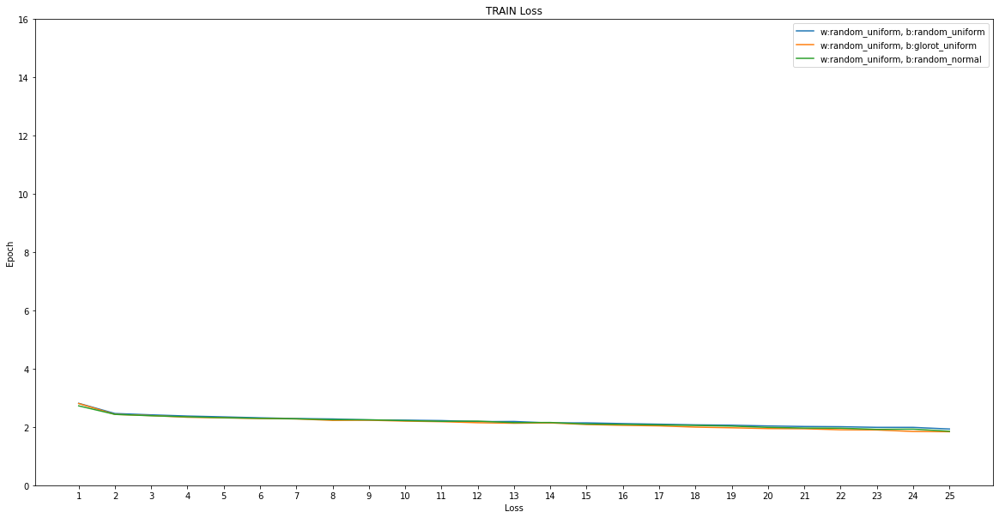

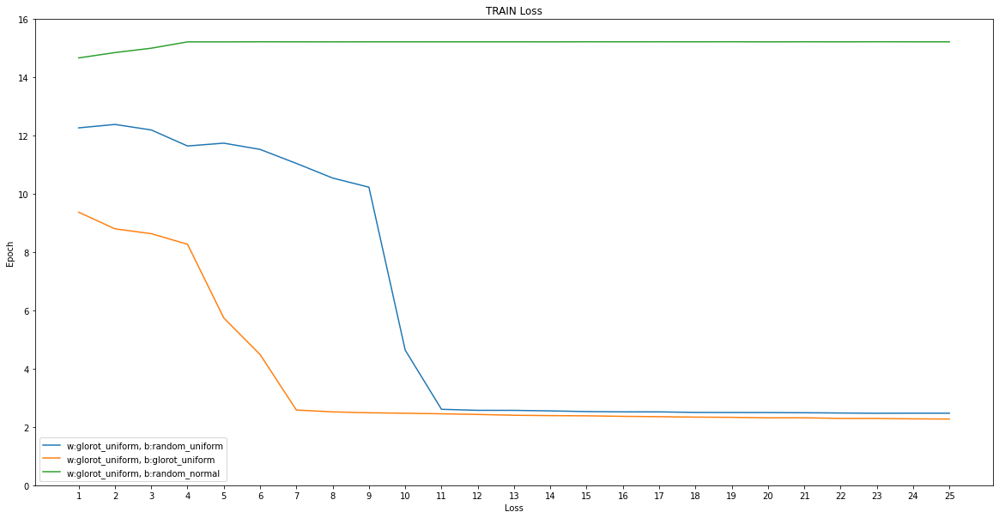

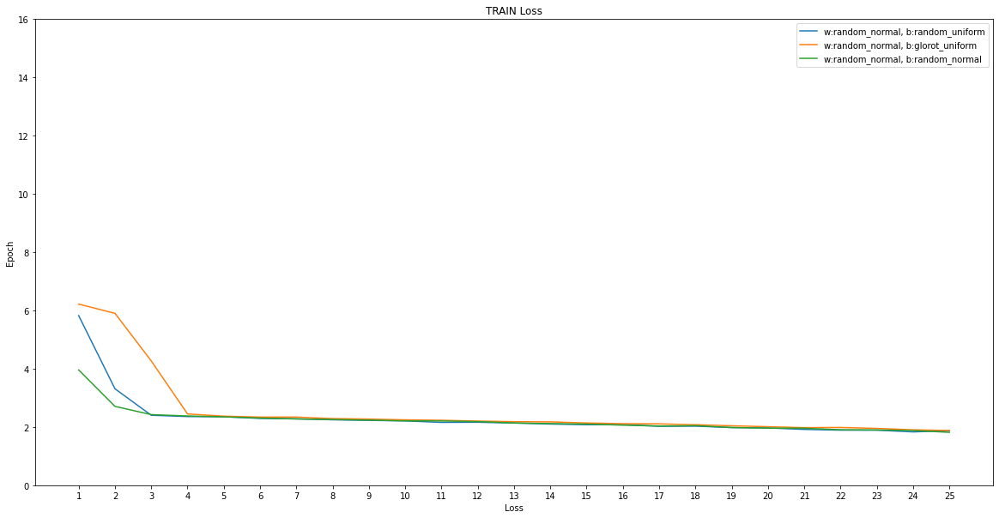

In [24]:
draw_simple_chart(data, epochs, 'TRAIN Loss', 'Loss', 'train_loss', ylim=[0, 16])

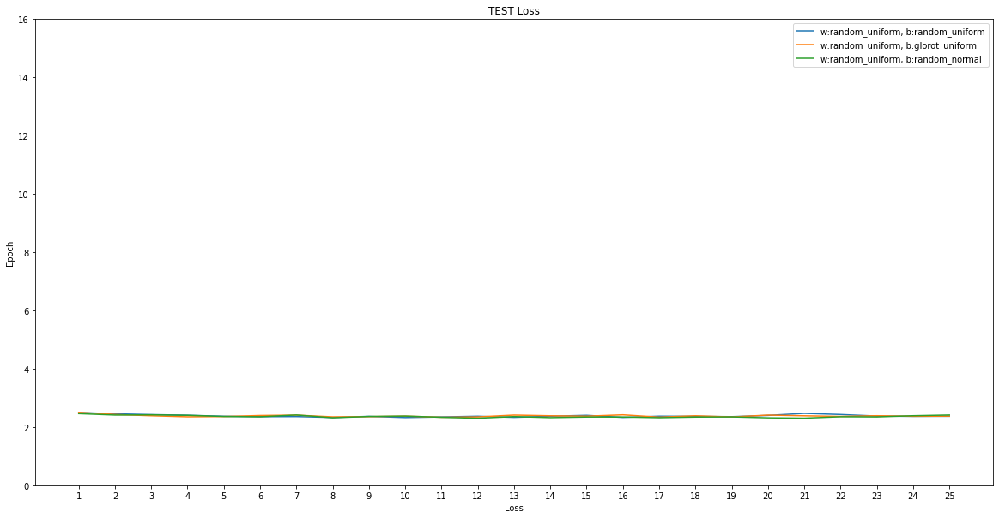

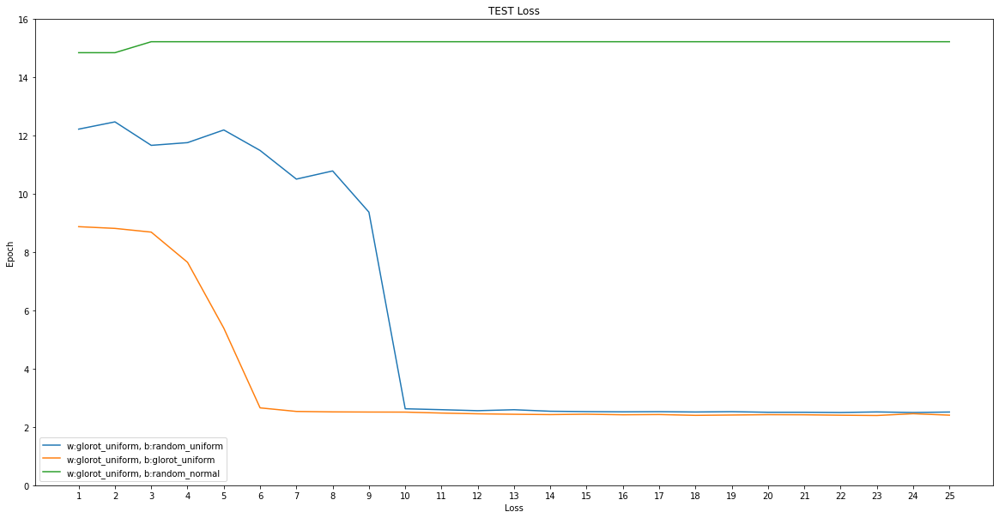

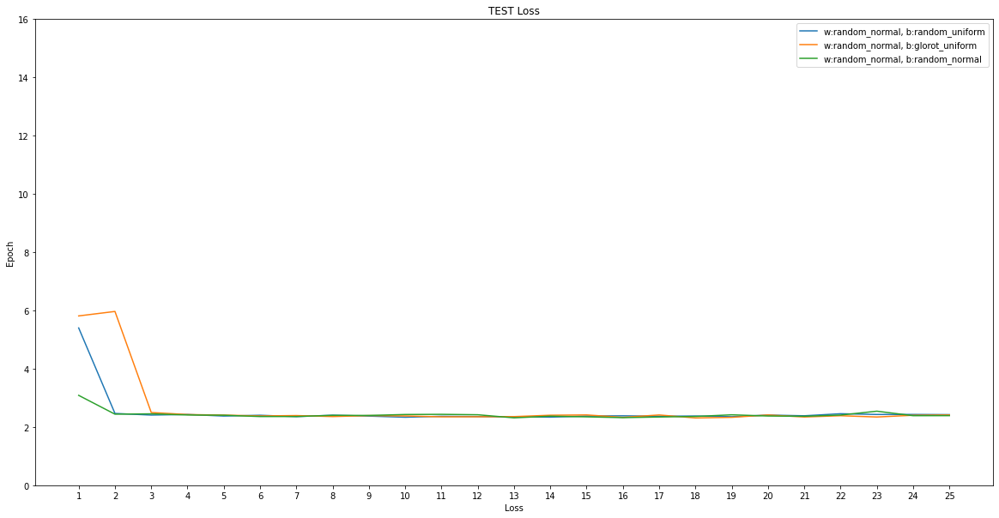

In [25]:
draw_simple_chart(data, epochs, 'TEST Loss', 'Loss', 'test_loss', ylim=[0, 16])

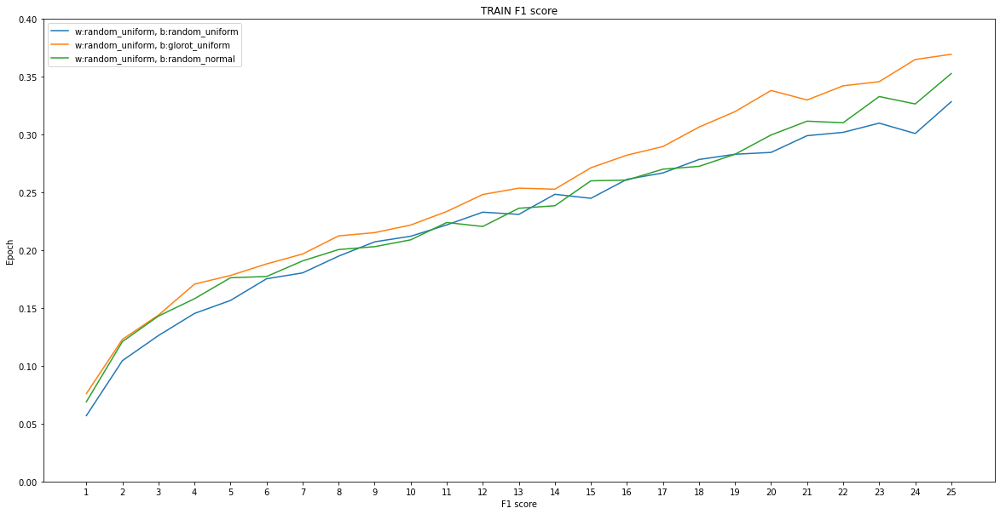

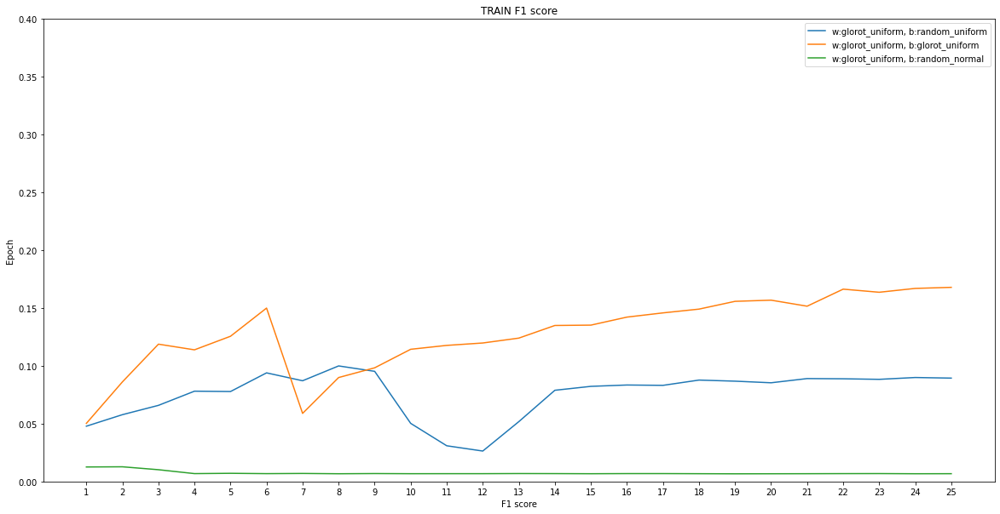

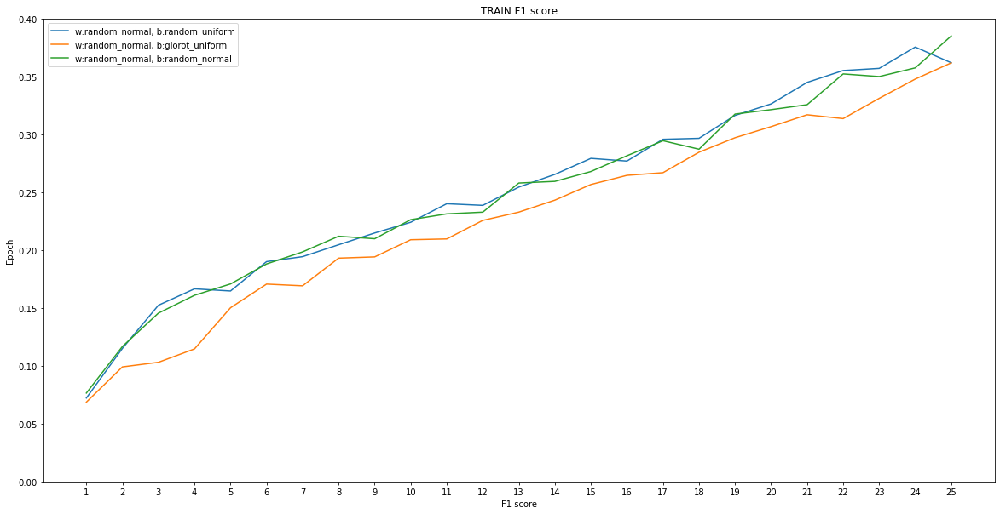

In [26]:
draw_simple_chart(data, epochs, 'TRAIN F1 score', 'F1 score', 'train_fscore', ylim=[0, 0.4])

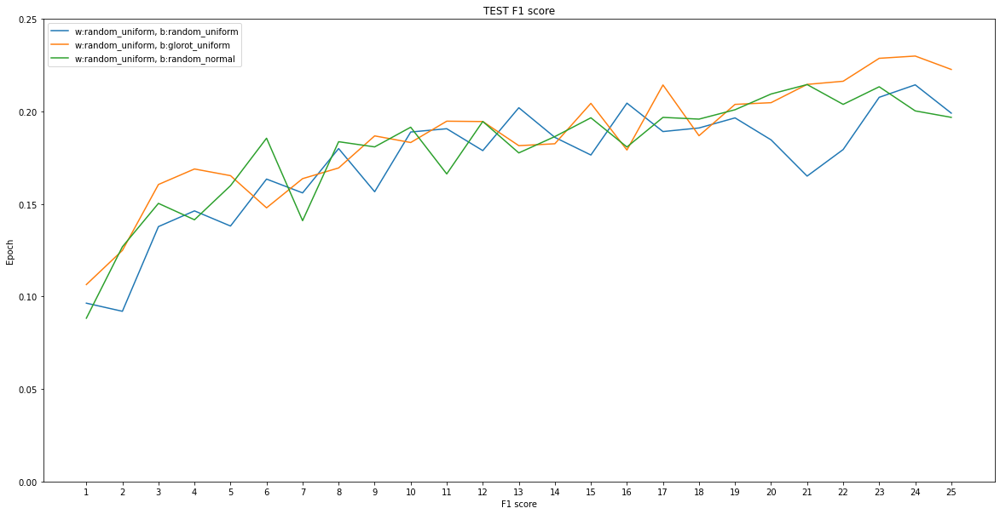

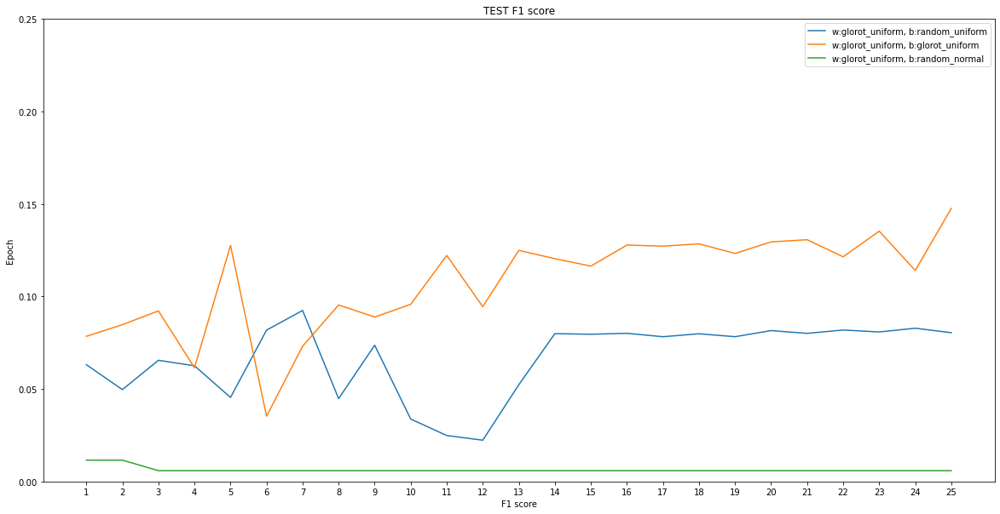

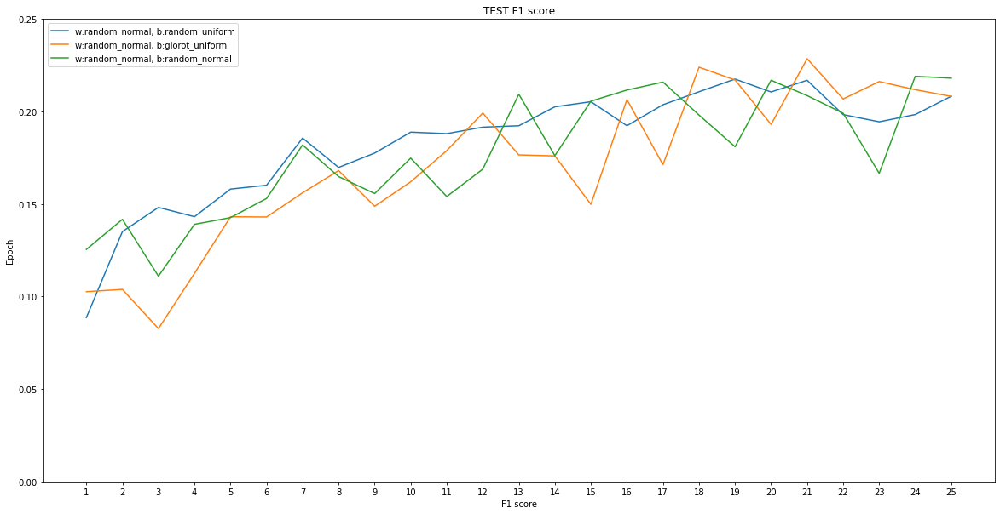

In [27]:
draw_simple_chart(data, epochs, 'TEST F1 score', 'F1 score', 'test_fscore', ylim=[0, 0.25])

### Wnioski
Przebadane zostały 4 metody inicjalizacji wag i biasów: random_uniform, random_normal, truncated_normal i variance_scaling. W ciągu eksperymentu zauważono, że inicjalizacja wag i biasów metodami *random normal* i *random uniform* wykazuje najlepsze wyniki, które minimalnie się róźnią między sobą. Natomiast inicjalizacja wag metodą *glorot uniform* daje najgorsze wyniki funkcji straty i fscore zarówno jak dla danych treningowych i testowych.

Do dalszych badań wybrano metodę random uniform do inicjalizacji wag i metodę glorot_uniform do inicjalizacji biasów. Ustalono, że rozbierzność wyników f1 score dla danych testowych jest minimalna.

## 1B

In [8]:
class OneLayerModel(BaseModel):
    def __init__(self, **kwargs):
        super(OneLayerModel, self).__init__()
        self.layer_1 = BaseLayer(output_dim=14, activation=tf.keras.activations.softmax)

    def call(self, inputs, training=False):
        outputs = self.layer_1(inputs)
        return outputs


class ThreeLayerModel(BaseModel):
    def __init__(self, **kwargs):
        super(ThreeLayerModel, self).__init__()
        self.layer_1 = BaseLayer(output_dim=1024, activation=tf.keras.activations.relu)
        self.layer_2 = BaseLayer(output_dim=256, activation=tf.keras.activations.relu)
        self.layer_3 = BaseLayer(output_dim=14, activation=tf.keras.activations.softmax)

    def call(self, inputs, training=False):
        outputs = self.layer_1(inputs)
        outputs = self.layer_2(outputs)
        outputs = self.layer_3(outputs)
        return outputs


# ResourceExhaustedError -> if 4096, 1024, 256, 14
# class FourLayerModel(BaseModel):
#     def __init__(self, **kwargs):
#         super(FourLayerModel, self).__init__()
#         self.layer_1 = BaseLayer(output_dim=4096, activation=tf.keras.activations.relu)
#         self.layer_2 = BaseLayer(output_dim=1024, activation=tf.keras.activations.relu)
#         self.layer_3 = BaseLayer(output_dim=256, activation=tf.keras.activations.relu)
#         self.layer_4 = BaseLayer(output_dim=14, activation=tf.keras.activations.softmax)

#     def call(self, inputs, training=False):
#         outputs = self.layer_1(inputs)
#         outputs = self.layer_2(outputs)
#         outputs = self.layer_3(outputs)
#         outputs = self.layer_4(outputs)
#         return outputs

In [10]:
models = [(ThreeLayerModel, 3), (BaseModel, 2), (OneLayerModel, 1)]
results = []

for m, l in models:
    model = m()
    model.fit(train_ds = train_ds, 
                x_test = x_test,
                y_test = y_test,
                cost_func = cost_func,
                optimizer = optimizer,
                learning_rate = learning_rate,
                epochs = epochs)
    results.append({'layers': l, 
                        'train_loss': [np.float64(i.numpy()) for i in model.train_loss], 
                        'train_fscore': list(model.train_fscore),
                        'test_loss': [np.float64(i.numpy()) for i in model.test_loss], 
                        'test_fscore': list(model.test_fscore)})
save_results(results, 'models')

100%|██████████| 25/25 [00:41<00:00,  1.67s/it]


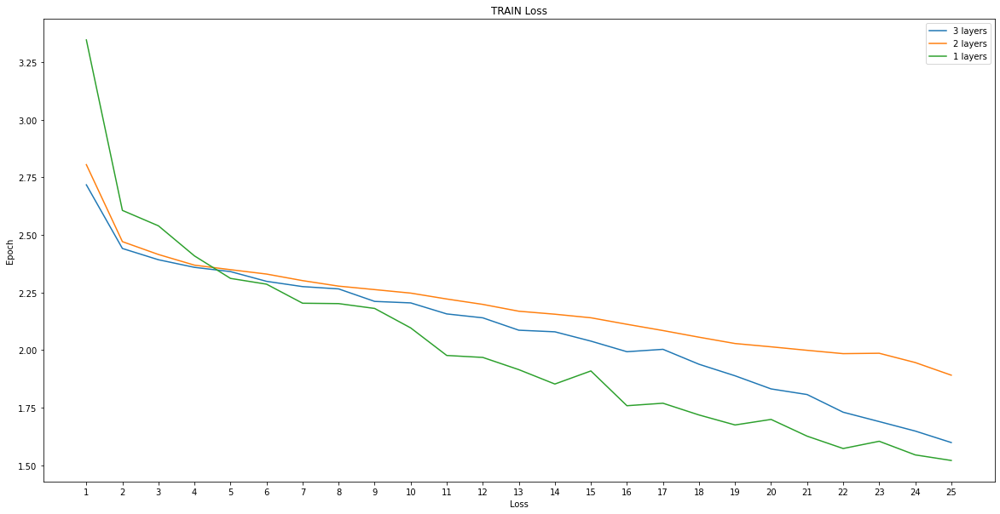

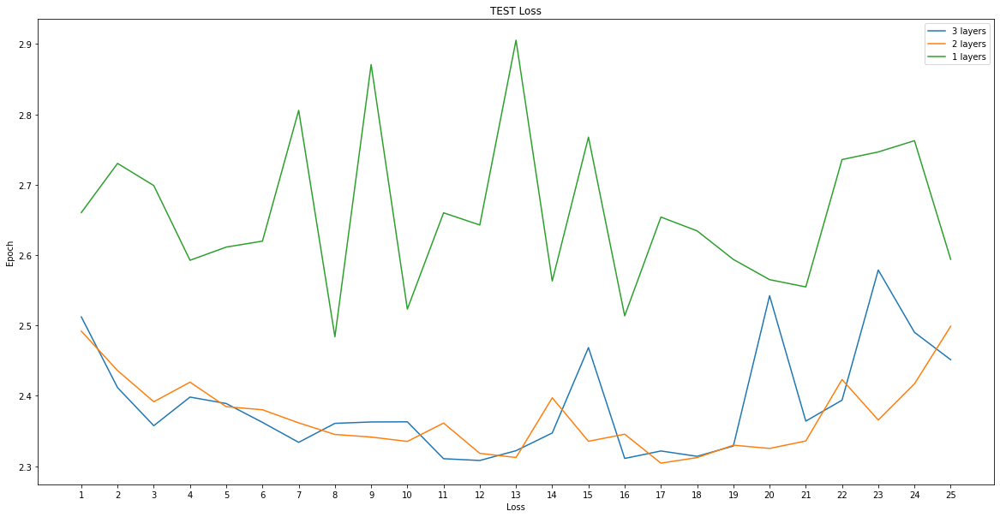

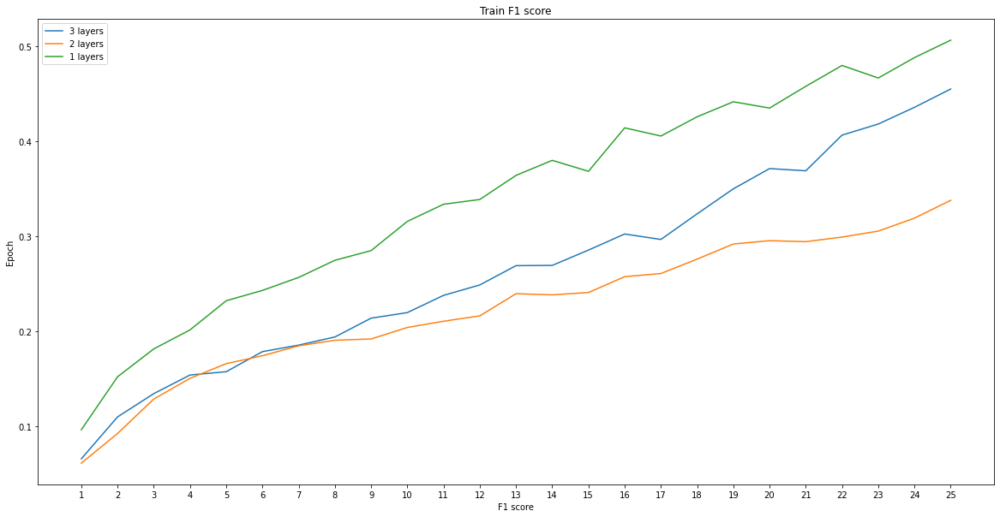

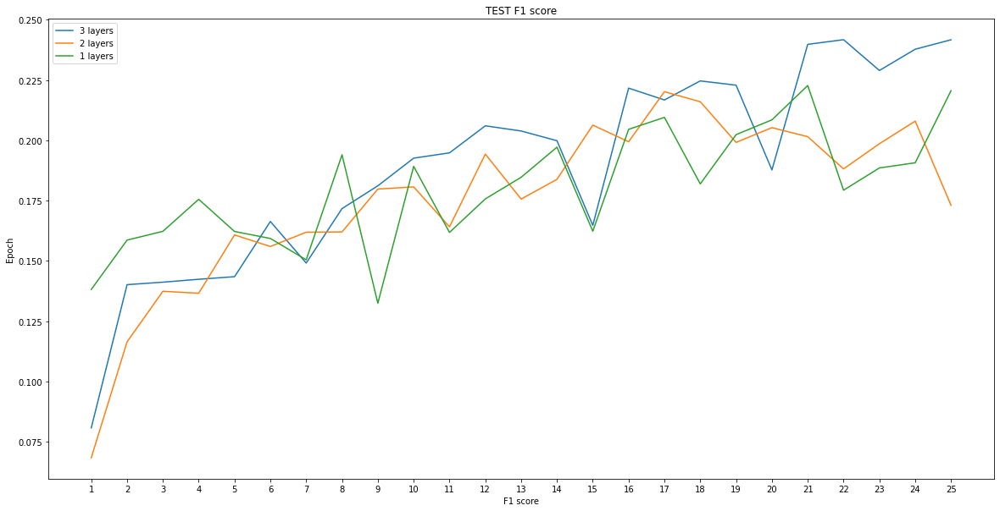

In [17]:
data = read_results('models')

def draw_layer_chart(data, epochs, title, xlabel, data_key, ylabel='Epoch', ylim=None):
    fig = plt.figure(figsize=(20,10))
    ax = plt.axes()

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    x = range(1, epochs+1)
    plt.xticks(np.arange(1, epochs+1))
    if ylim:
        ax.set_ylim(ylim)

    for d in data:
        ax.plot(x, d[data_key], label=f'{d["layers"]} layers')

    plt.legend()

draw_layer_chart(data, epochs, 'TRAIN Loss', 'Loss', 'train_loss')
draw_layer_chart(data, epochs, 'TEST Loss', 'Loss', 'test_loss')
draw_layer_chart(data, epochs, 'Train F1 score', 'F1 score', 'train_fscore')
draw_layer_chart(data, epochs, 'TEST F1 score', 'F1 score', 'test_fscore')

### Wnioski
Przebadane zostały 4 modele wg liczby warstw: *OneLayerModel*(na wyjściu 14), *BaseModel*(256 i 14), *ThreeLayerModel*(1024, 256, i 14) i *FourLayerModel*(256, 128, 64 i 14). Próbowano zaimplementować model czterowarstwowy posiadający 4096, 1024, 256 i 14 neuronów na wyjściu, ale program rzucał błąd **ResourceExhaustedError**. 

Jak widać na wykresach jednowarstwowy model szybko się dostosowuje do danych treningowych, i pokazuje najlepsze wyniki dla funkcji straty i miary fscore. Ale niezbyt skutecznie działa na danych testowych. Wyniki Fscore minimalnie różnią się od wyników pozostałych modeli, ale ponosi największe straty na zbiorze testowym.

Dla dalszych badań został wybrany trzechwarstwowy model.

# TASK 
Init params

In [29]:
epochs = [50, 25, 10]
batch_sizes = [500, 100, 10]

opimizers = [tf.keras.optimizers.Adam, tf.keras.optimizers.Adagrad, tf.keras.optimizers.Adamax]

learning_rate = [0.01, 0.001, 0.0001]

cost_func = tf.keras.losses.SparseCategoricalCrossentropy()

In [ ]:
train_dss = [(get_train_ds(x_train, y_train, bs), bs) for bs in batch_sizes]

In [11]:
results = []

for tds, bs in train_dss:
    for e in epochs:
        for o in opimizers:
            for lr in learning_rate:
                model = ThreeLayerModel()
                start_time = time.time()
                model.fit(train_ds = tds, 
                            x_test = x_test,
                            y_test = y_test,
                            cost_func = cost_func,
                            optimizer = o,
                            learning_rate = lr,
                            epochs = e)
                results.append({'batch_size': bs, 'epochs':e, 'optimizer':o.__name__, 'learning_rate':lr,
                        'train_loss': [np.float64(i.numpy()) for i in model.train_loss], 
                        'train_fscore': list(model.train_fscore),
                        'test_loss': [np.float64(i.numpy()) for i in model.test_loss], 
                        'test_fscore': list(model.test_fscore),
                        'per_epoch_time': list(model.per_epoch_time),
                        'fit_time': time.time()-start_time})
    
save_results(results, 'hyperparameters')

 64%|██████▍   | 32/50 [11:59<06:44, 22.48s/it]


KeyboardInterrupt: 

In [22]:
data = read_results('hyperparameters')
len(data)

81

In [61]:
def draw_time_chart(my_data):
    labels = [f'{d["batch_size"]}' for d in my_data]
    per_epoch = [round(sum(d['per_epoch_time'])/len(d['per_epoch_time']), 1) for d in my_data]
    final = [round(d['fit_time'], 1) for d in my_data]

    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots(figsize=(20,10))
    rects1 = ax.bar(x - width/2, per_epoch, width, label='per epoch')
    rects2 = ax.bar(x + width/2, final, width, label='final')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Time')
    ax.set_title('Per epoch time and final time')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()


    def autolabel(rects):
        """Attach a text label above each bar in *rects*, displaying its height."""
        for rect in rects:
            height = rect.get_height()
            ax.annotate('{}'.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')


    autolabel(rects1)
    autolabel(rects2)

    fig.tight_layout()

    plt.show()

In [23]:
def draw_hyppar_chart(data, epochs, title, xlabel, data_key, ylabel='Epoch', ylim=None):
    fig = plt.figure(figsize=(20,10))
    ax = plt.axes()

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    x = range(1, epochs+1)
    plt.xticks(np.arange(1, epochs+1))
    if ylim:
        ax.set_ylim(ylim)

    for d in data:
        ax.plot(x, d[data_key], label=f'batch:{d["batch_size"]} - optimizer:{d["optimizer"]} - lr:{d["learning_rate"]}')

    plt.legend()

# EPOCHS = 10

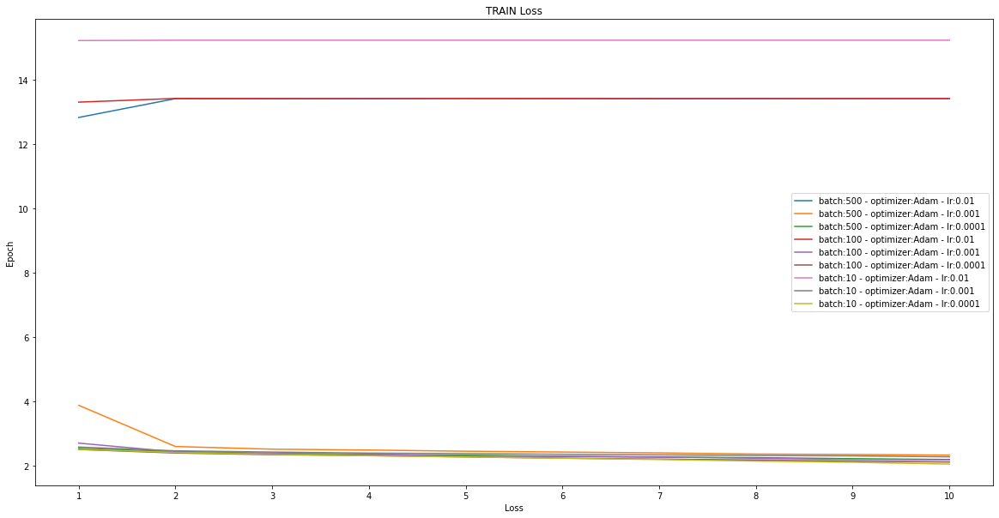

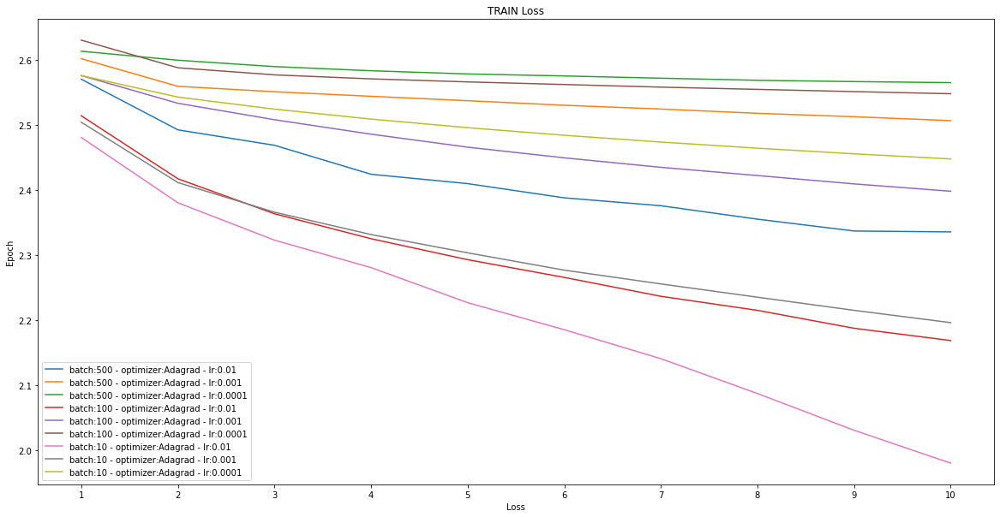

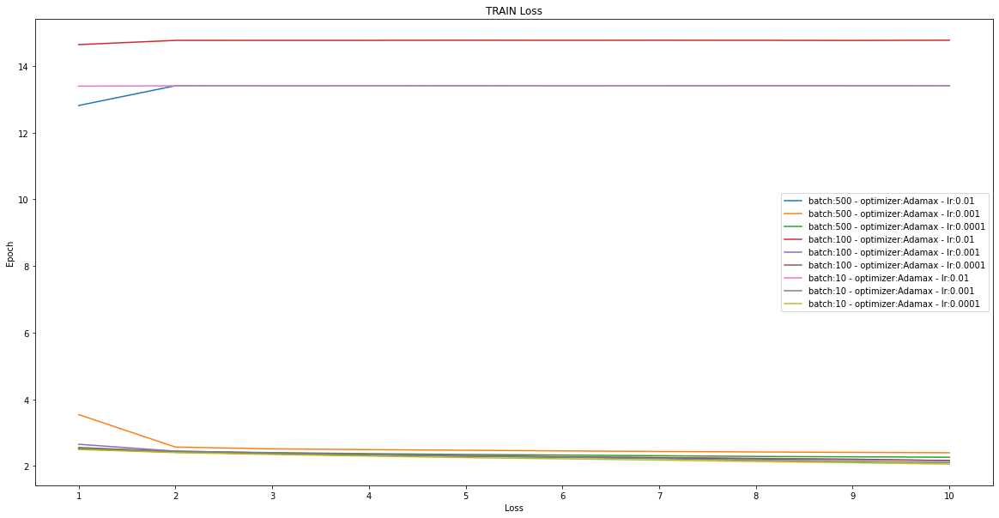

In [25]:
ep = 10
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TRAIN Loss', 'Loss', 'train_loss')

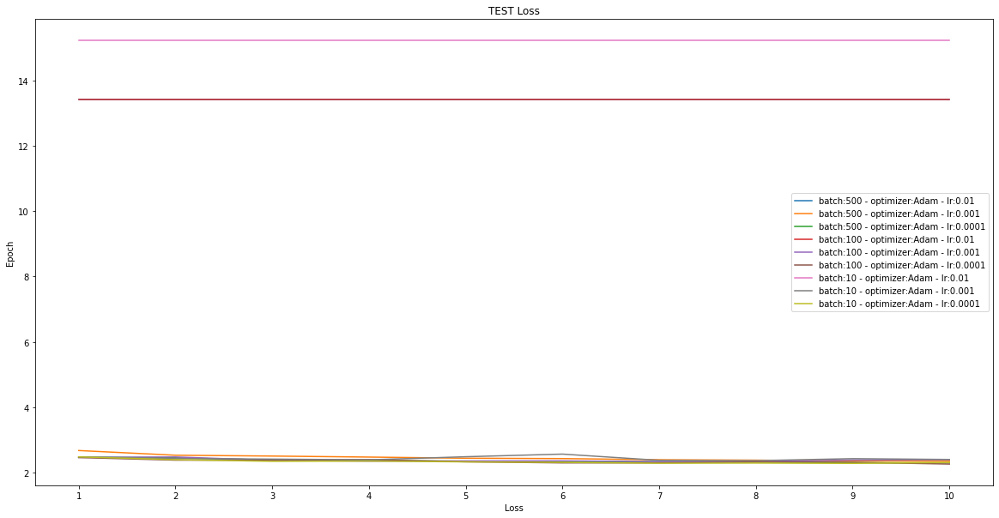

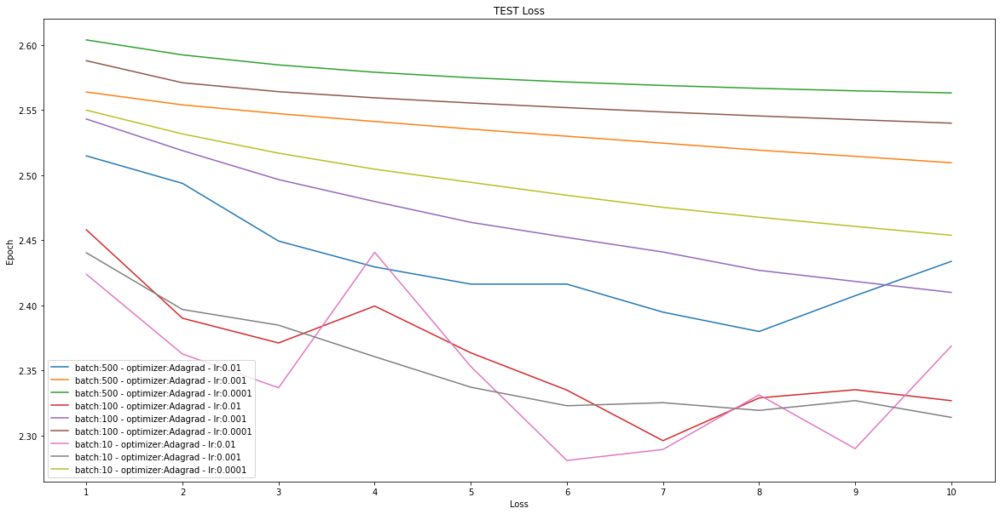

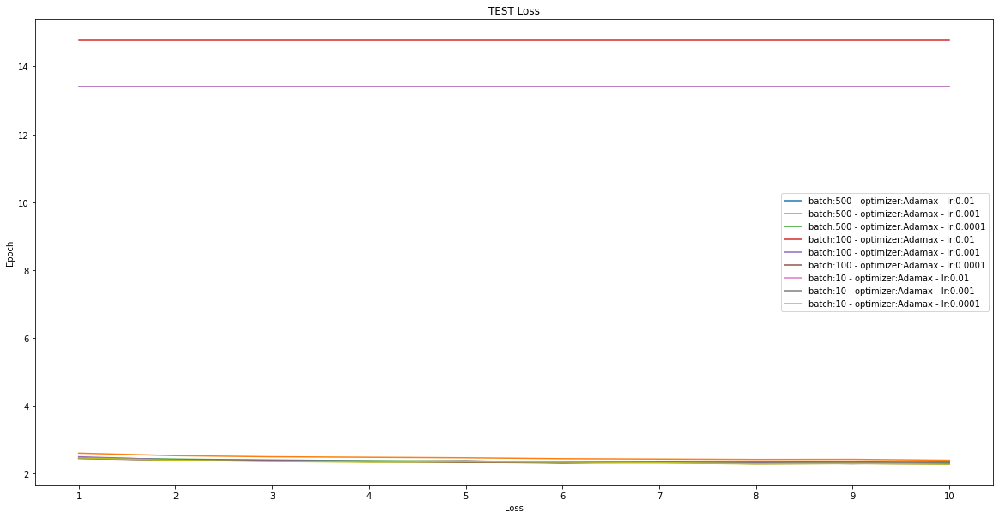

In [26]:
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TEST Loss', 'Loss', 'test_loss')

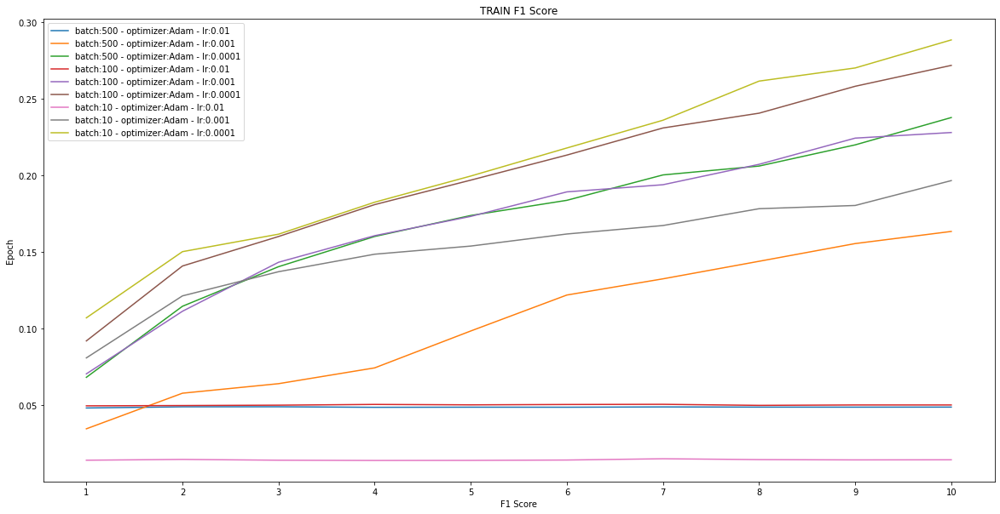

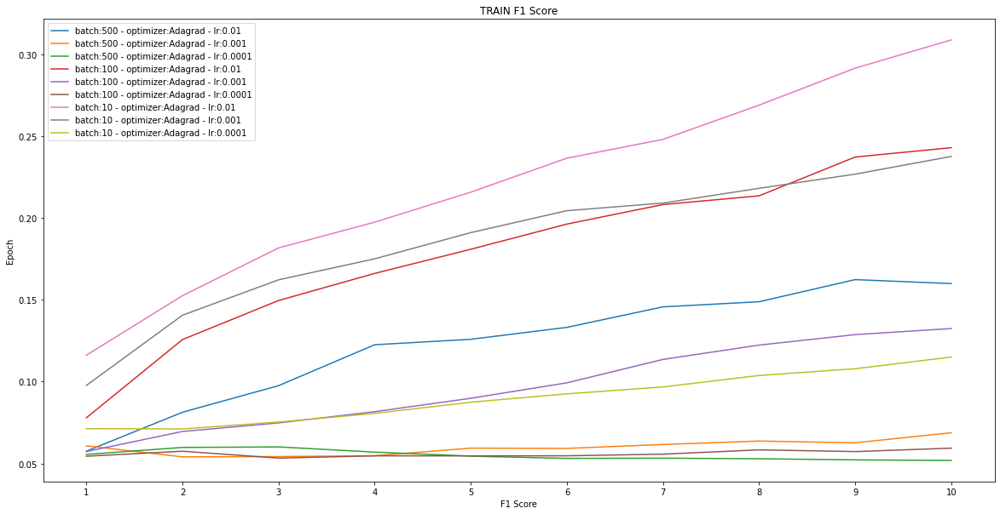

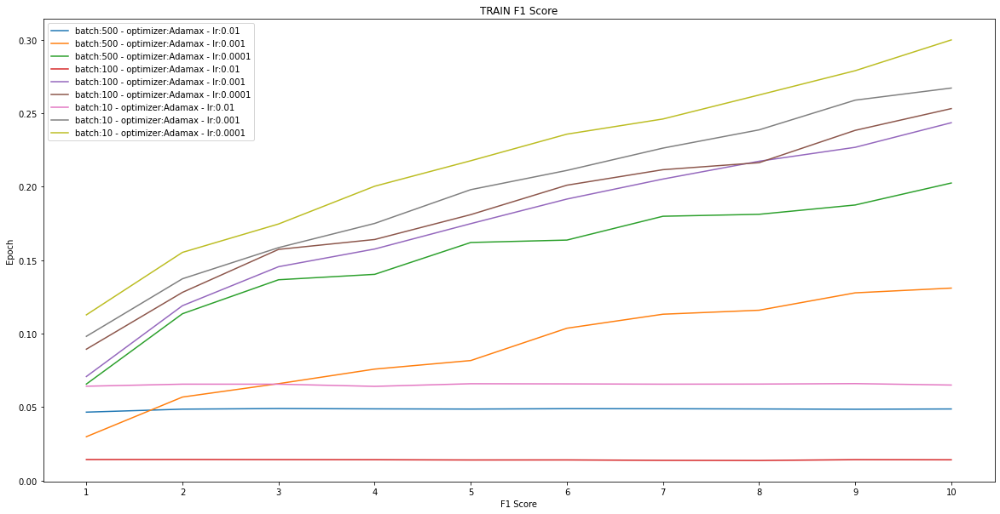

In [27]:
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TRAIN F1 Score', 'F1 Score', 'train_fscore')

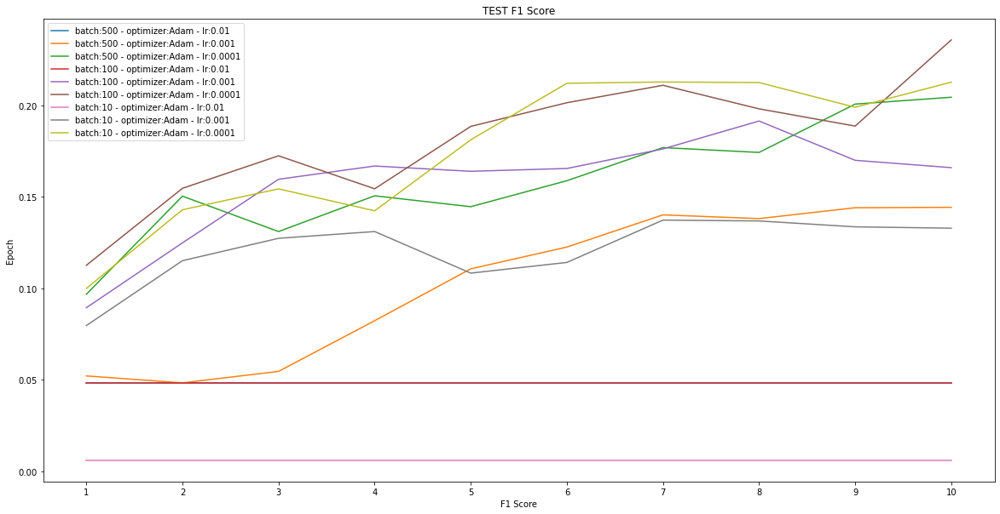

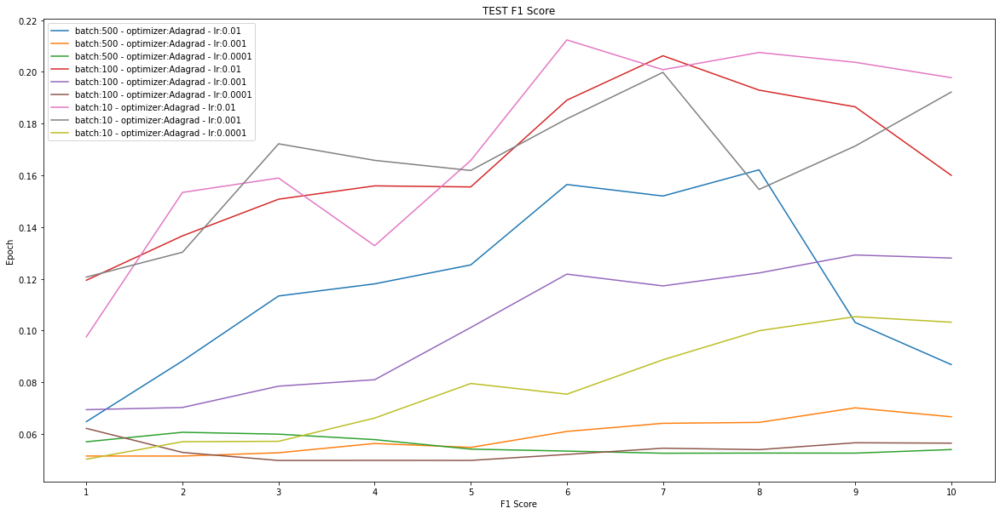

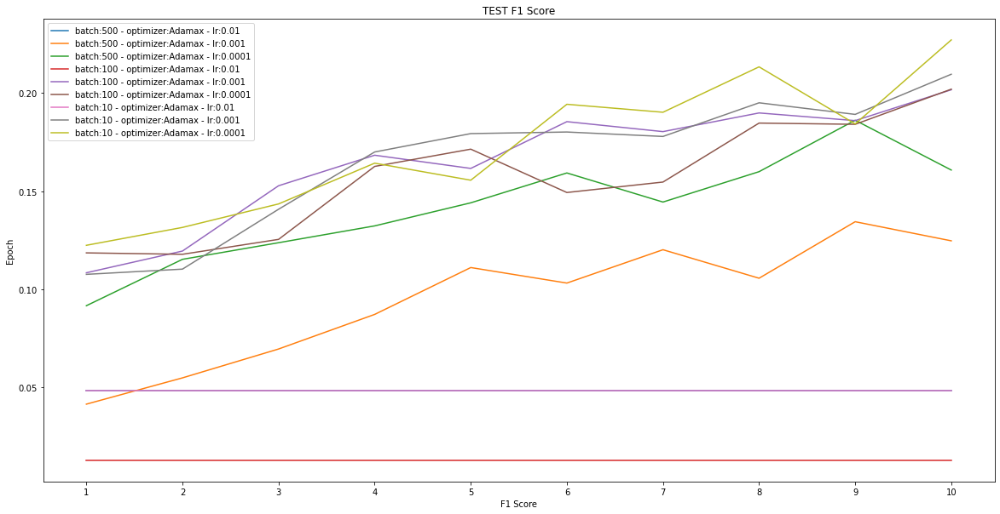

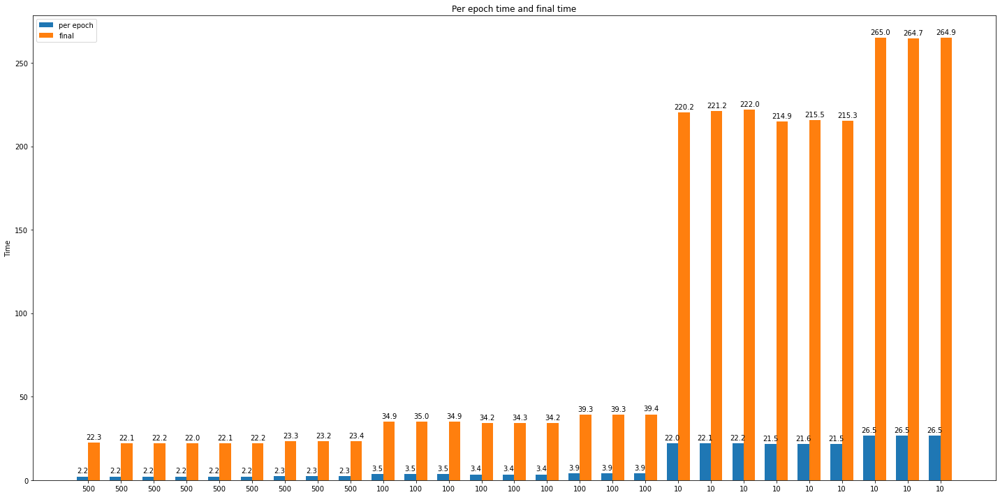

In [62]:
ep = 10
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TEST F1 Score', 'F1 Score', 'test_fscore')
draw_time_chart(sdata)

# EPOCHS = 25

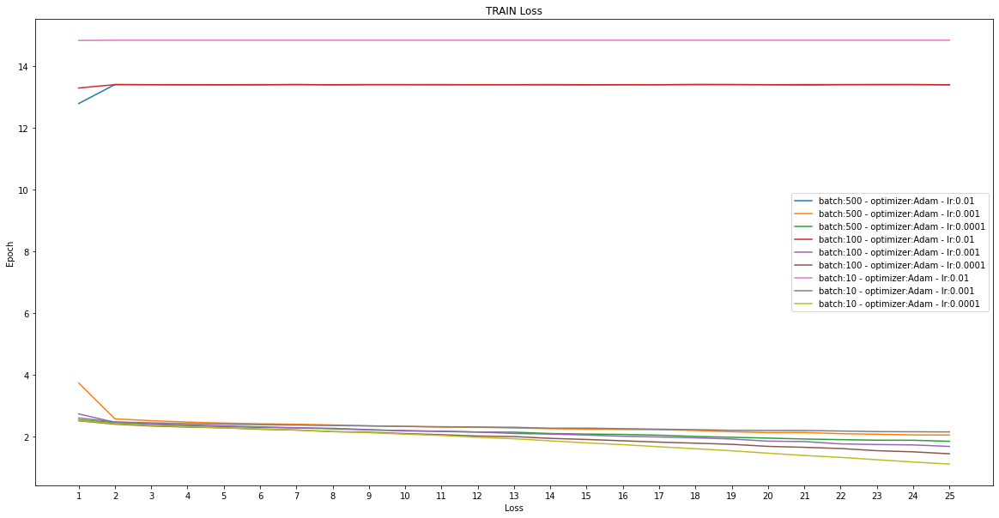

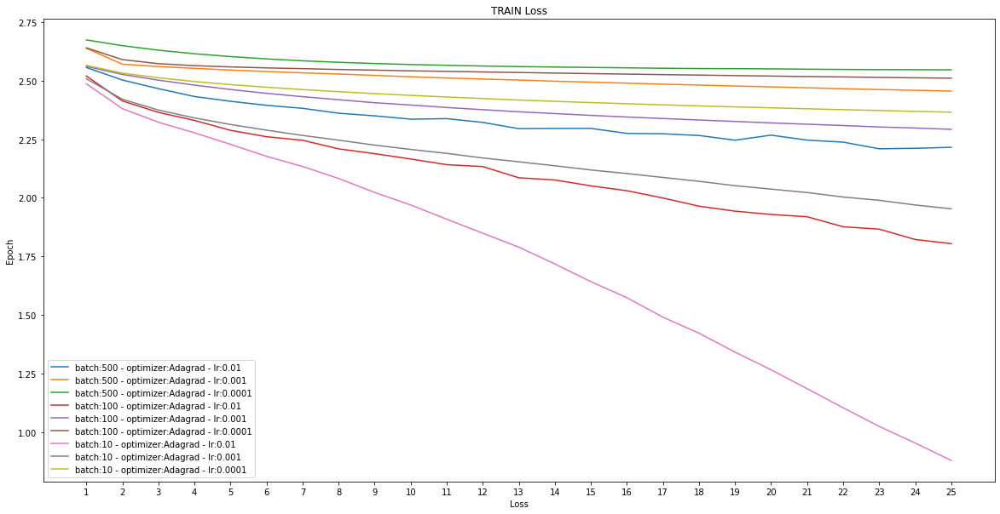

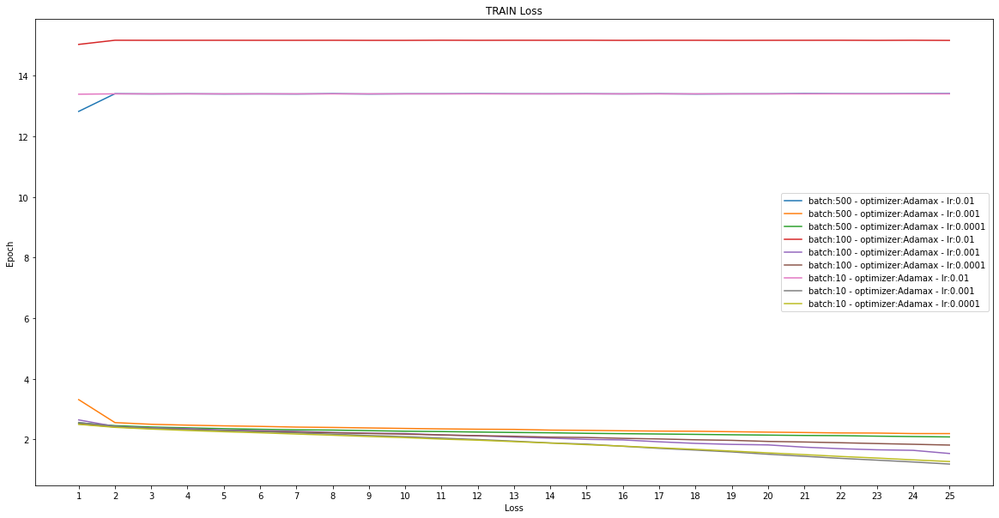

In [30]:
ep = 25
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TRAIN Loss', 'Loss', 'train_loss')

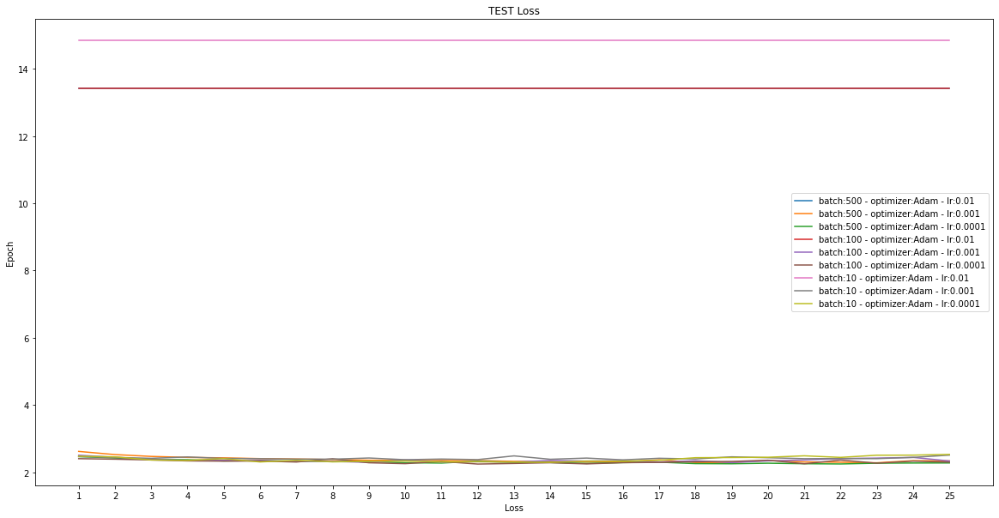

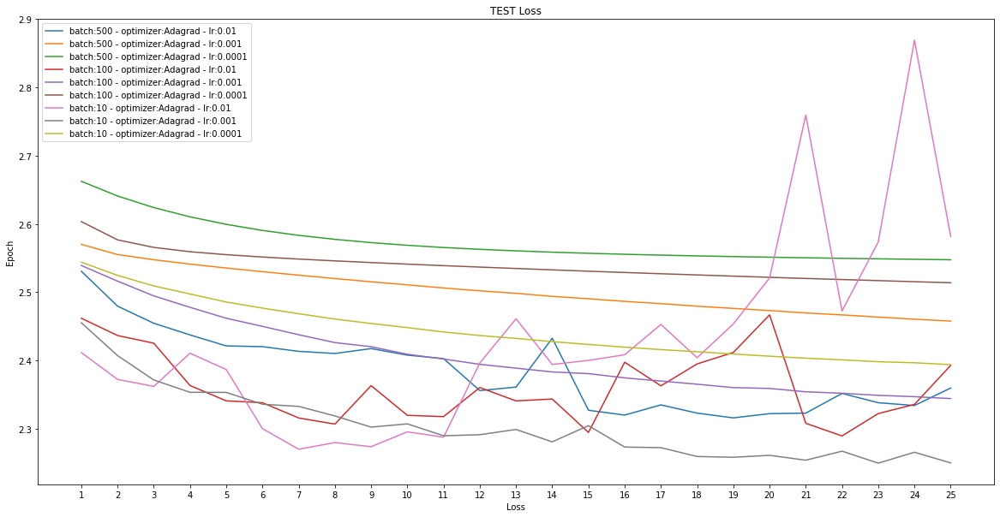

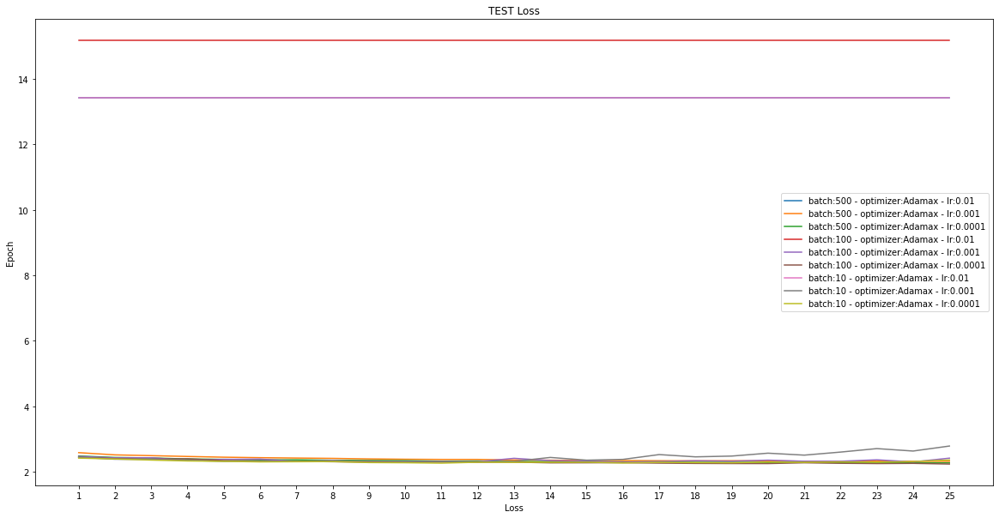

In [31]:
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TEST Loss', 'Loss', 'test_loss')

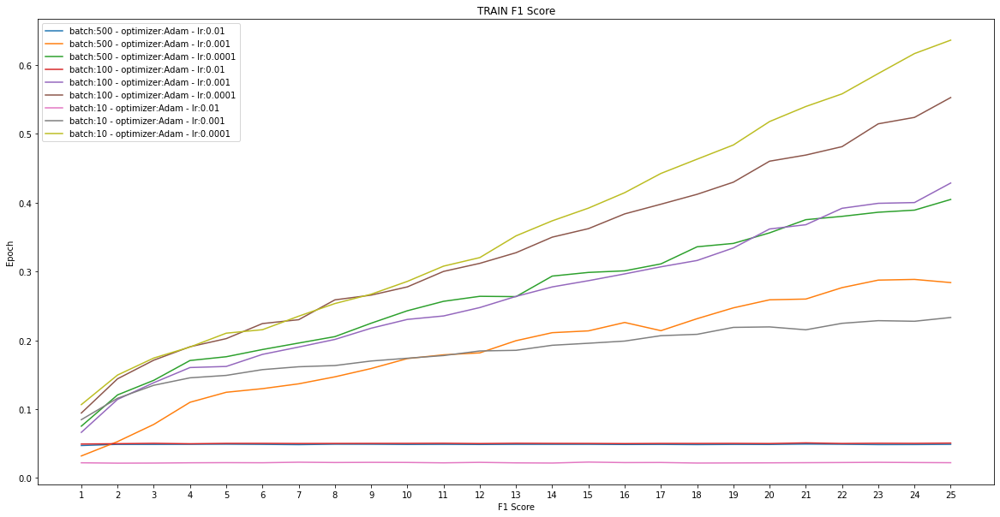

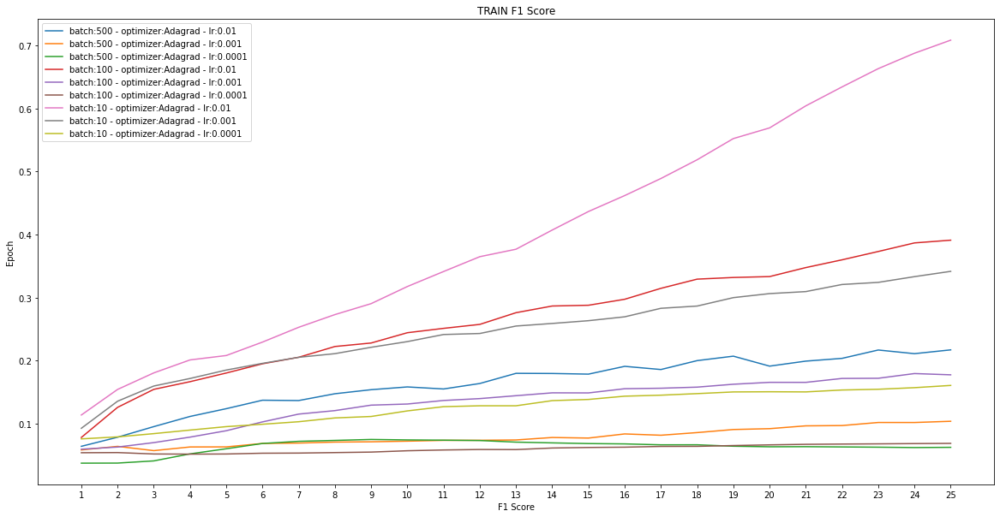

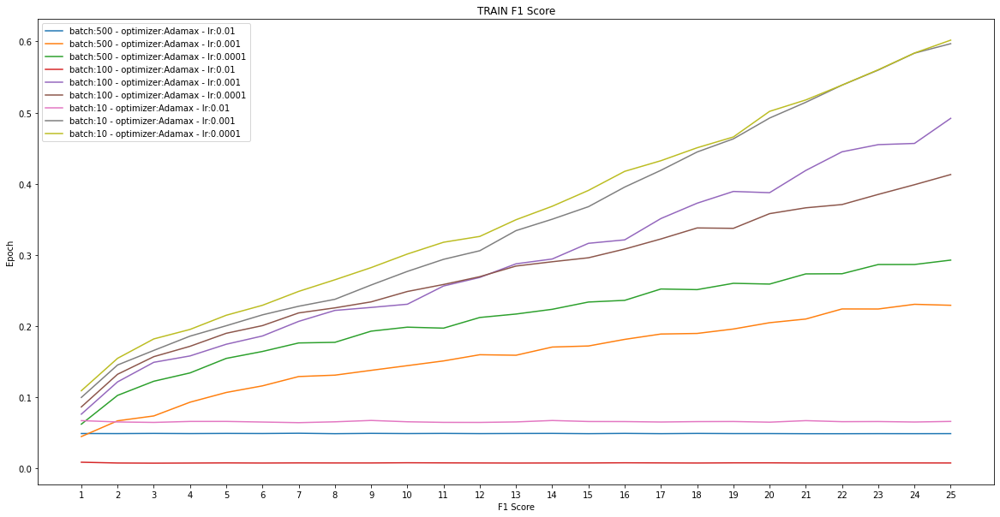

In [32]:
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TRAIN F1 Score', 'F1 Score', 'train_fscore')

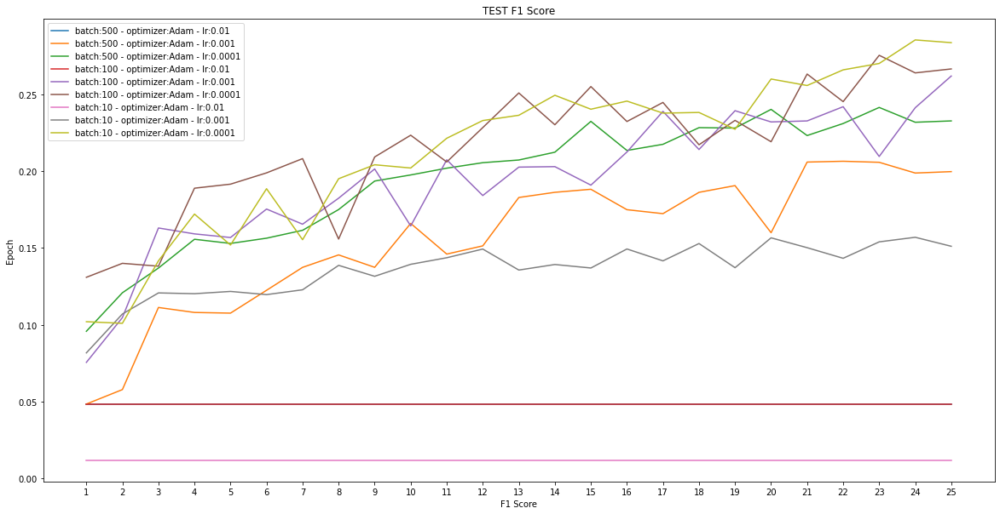

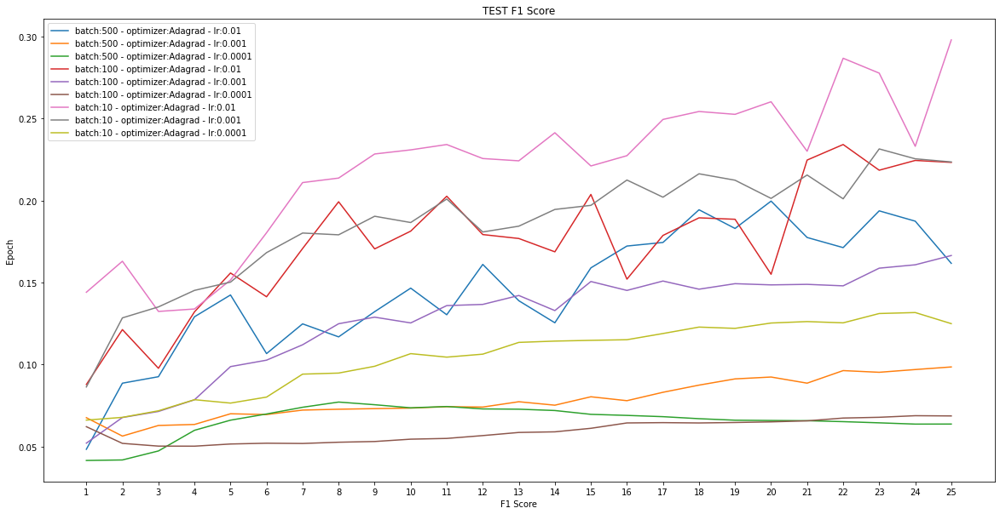

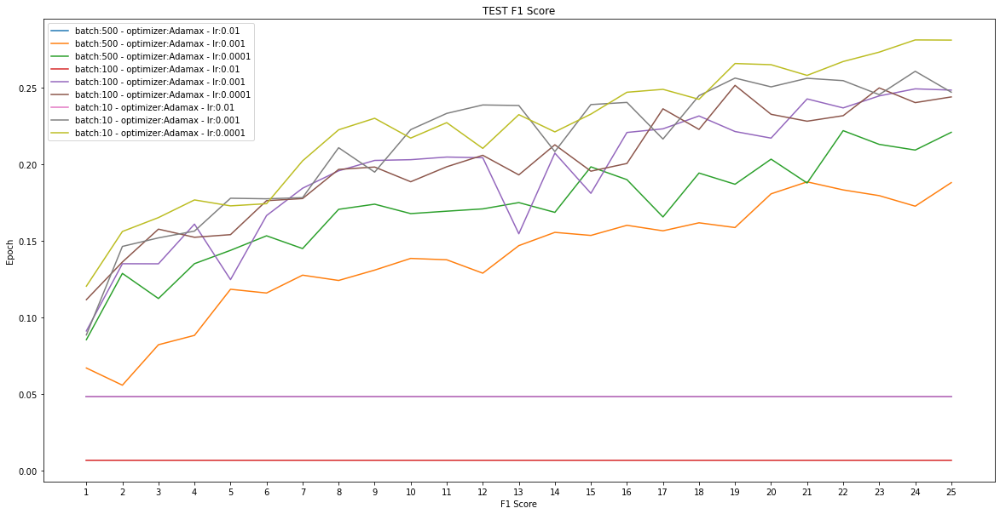

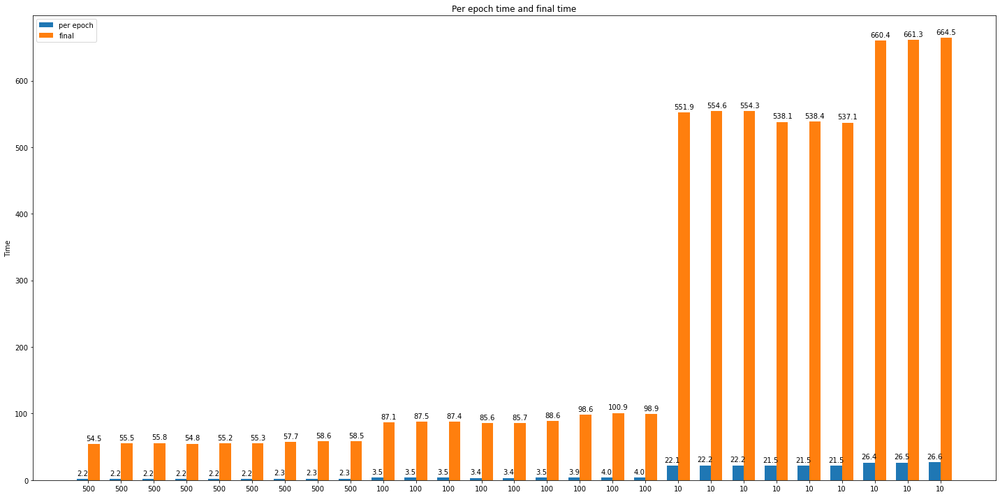

In [63]:
ep=25
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TEST F1 Score', 'F1 Score', 'test_fscore')
draw_time_chart(sdata)

# EPOCHS = 50

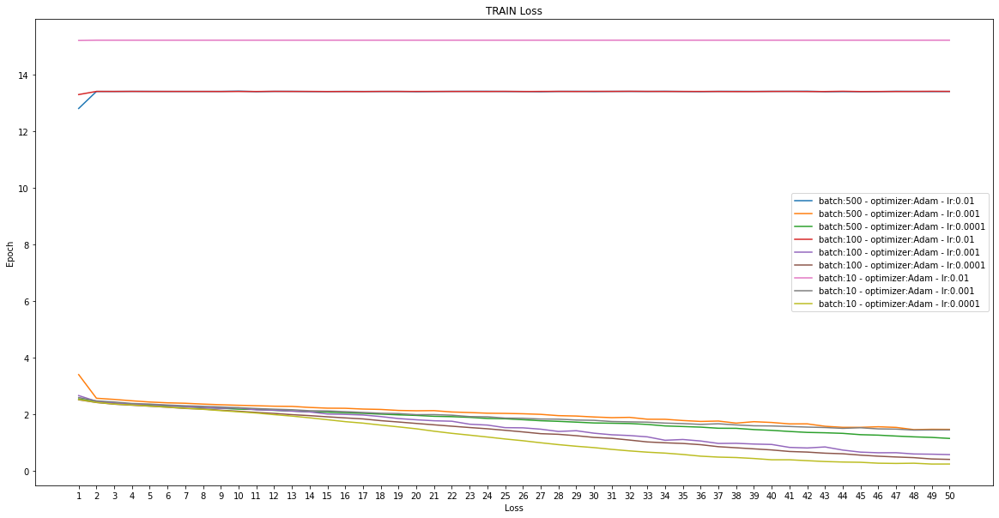

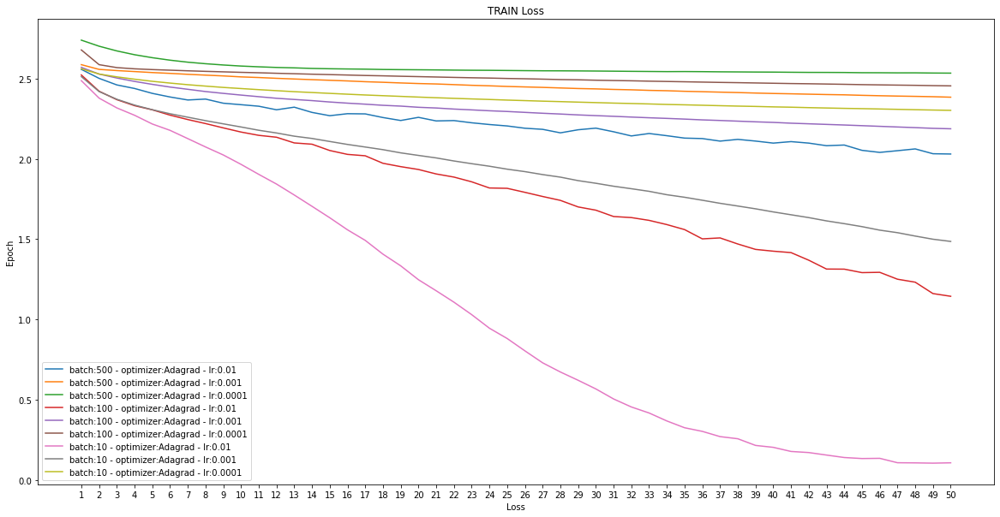

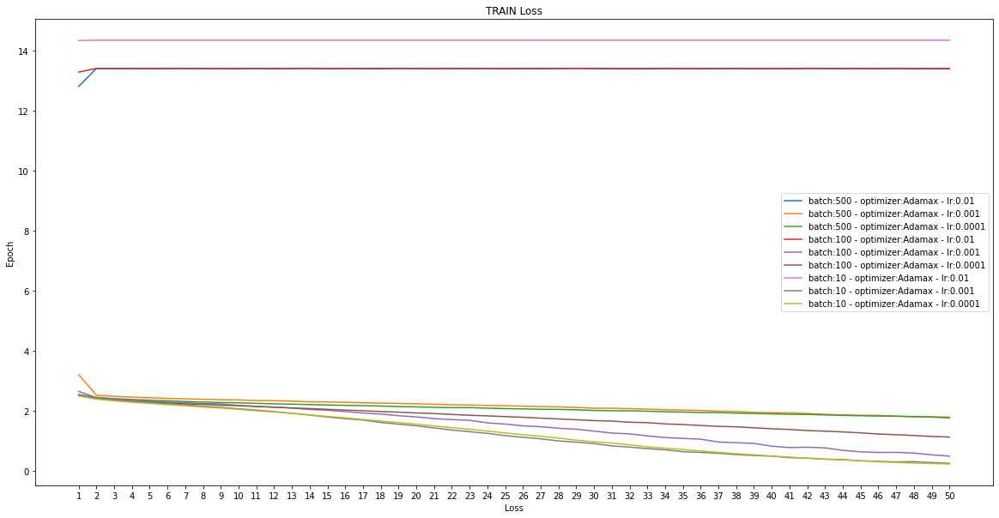

In [34]:
ep = 50
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TRAIN Loss', 'Loss', 'train_loss')

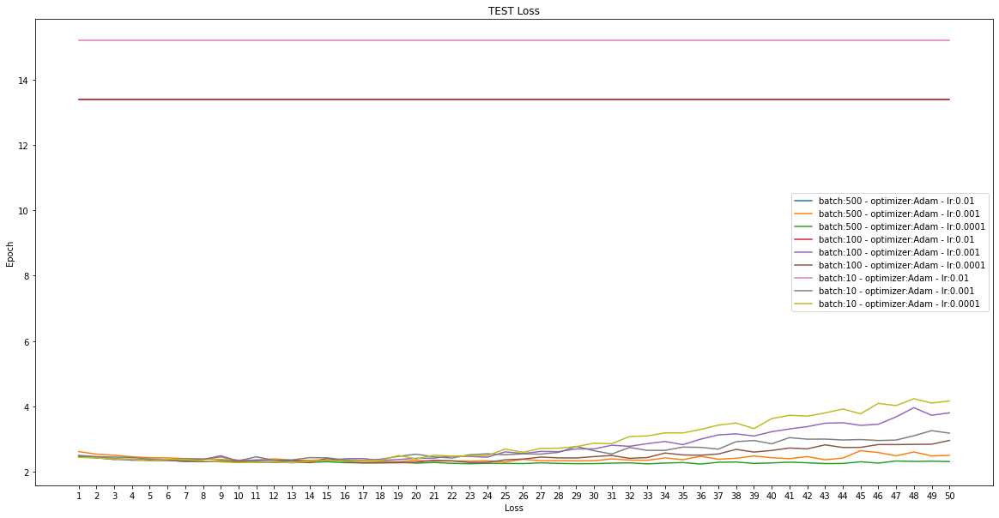

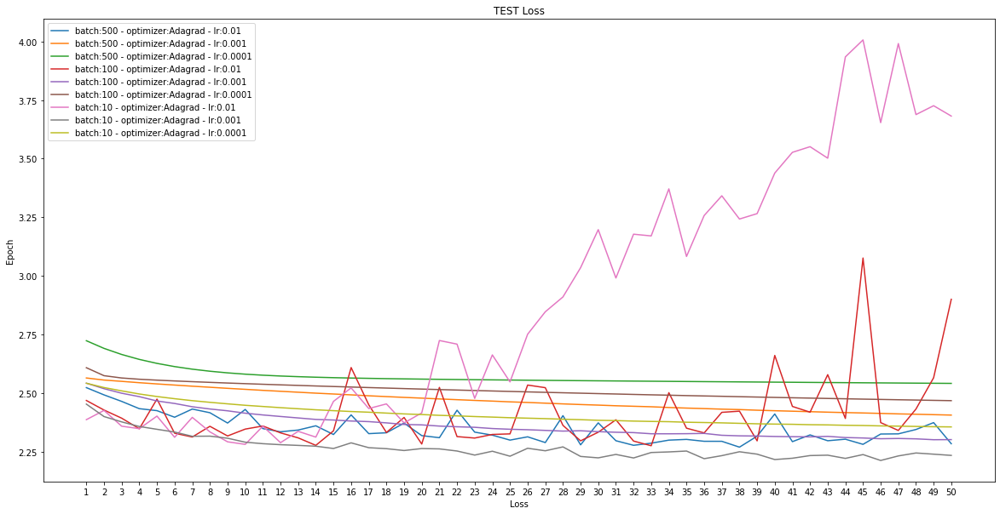

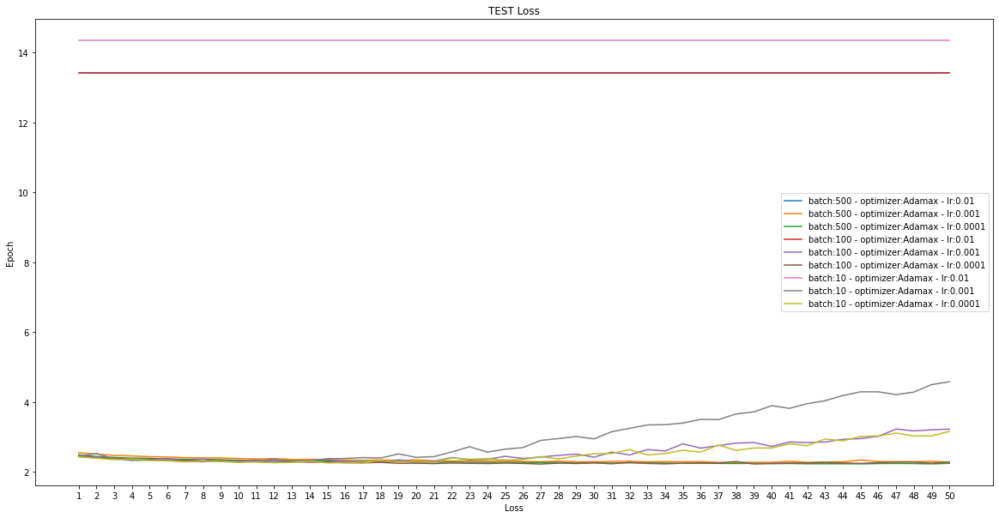

In [35]:
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TEST Loss', 'Loss', 'test_loss')

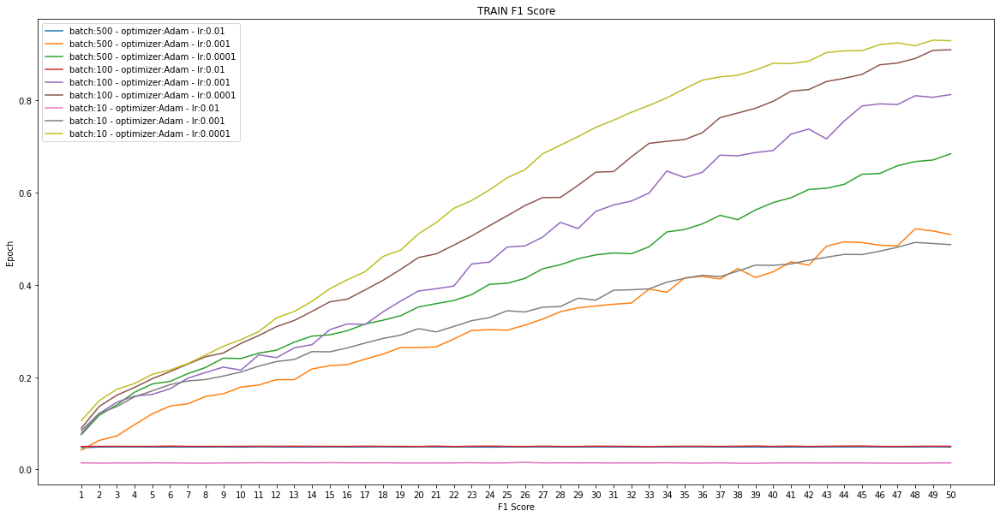

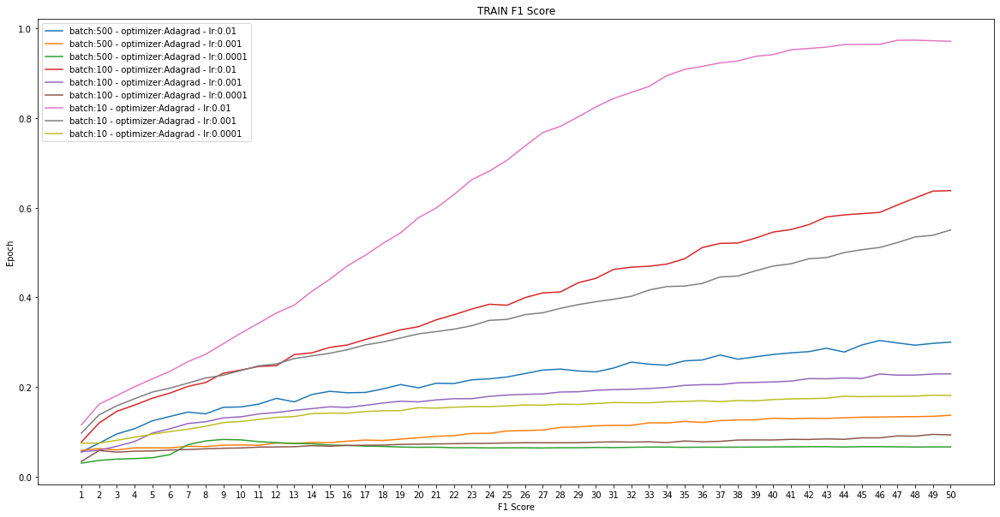

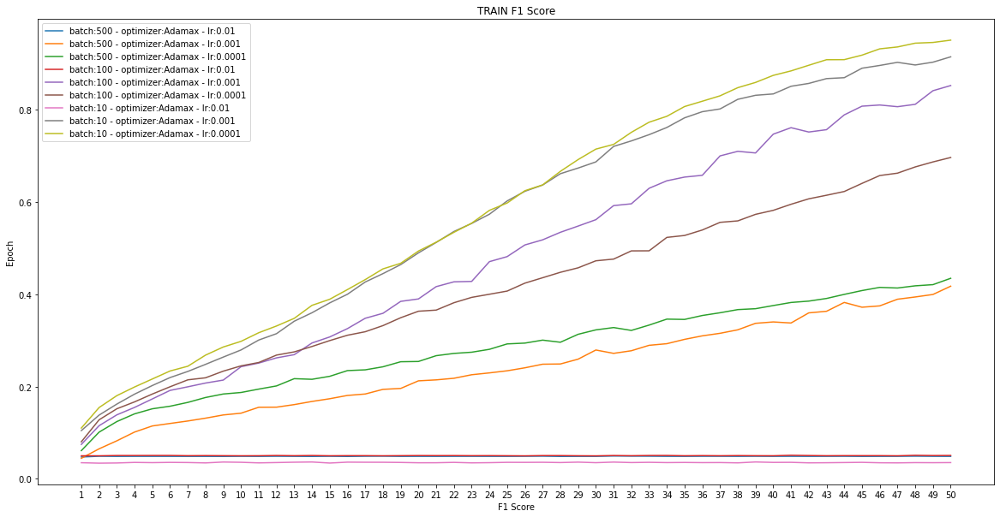

In [36]:
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TRAIN F1 Score', 'F1 Score', 'train_fscore')

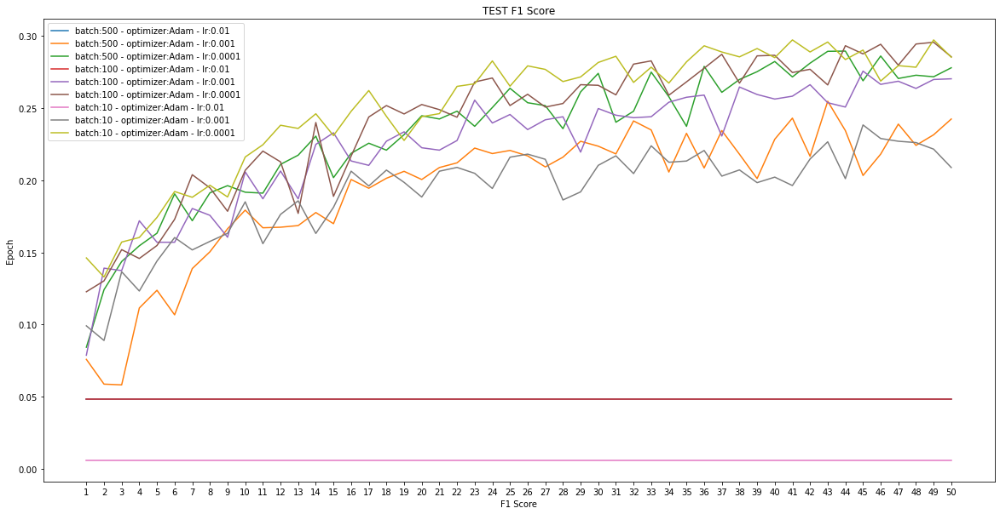

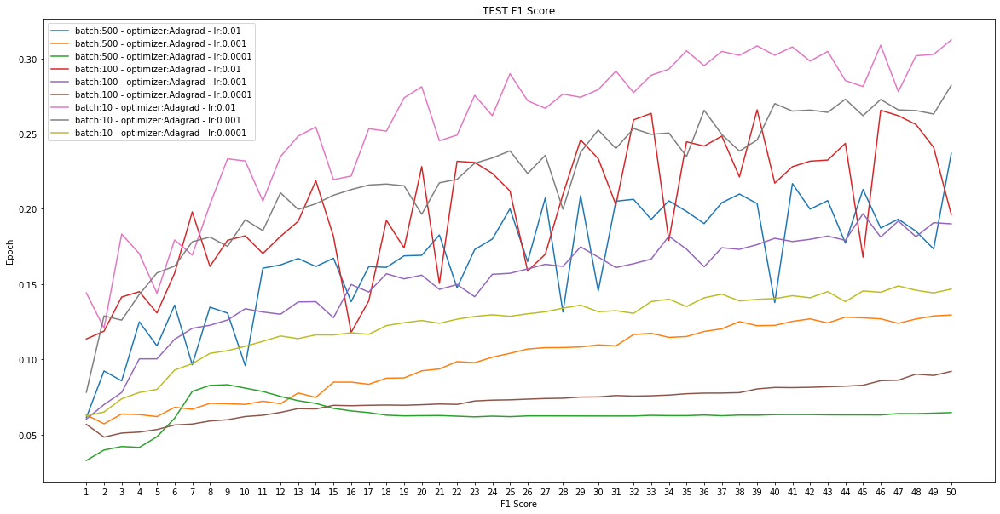

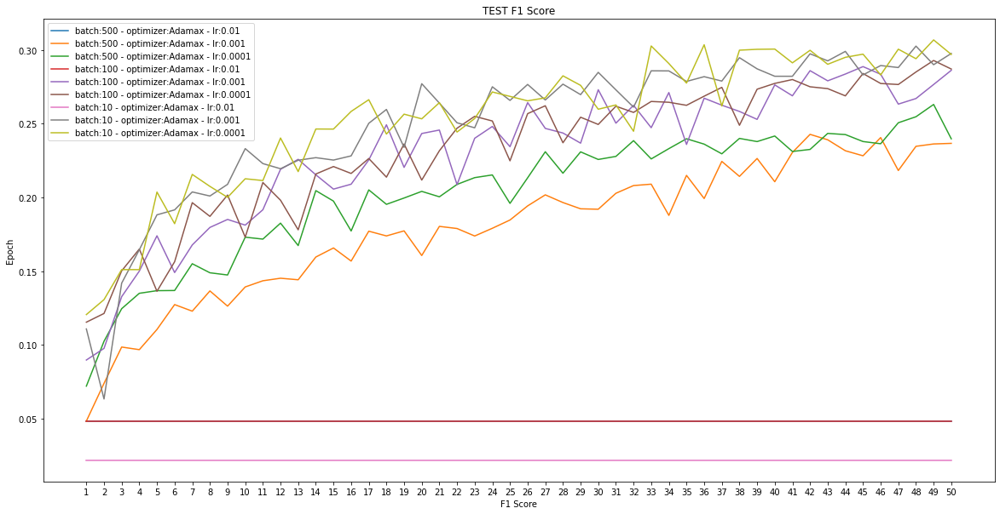

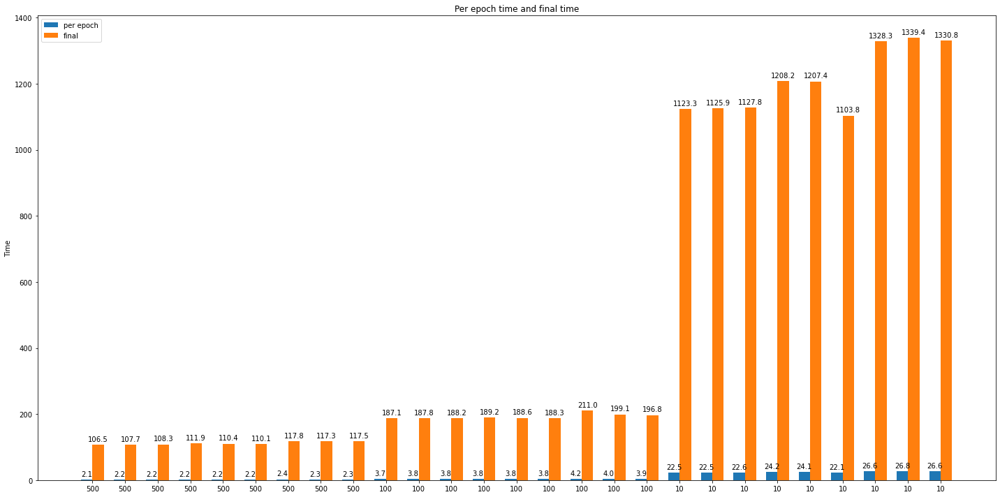

In [64]:
ep=50
sdata = [d for d in data if d['epochs'] == ep]
for o in opimizers:
    sub_data = [d for d in sdata if d['optimizer'] == o.__name__]
    draw_hyppar_chart(sub_data, ep, 'TEST F1 Score', 'F1 Score', 'test_fscore')
draw_time_chart(sdata)

## Wnioski

W badaniu przyjęto następne parametry: optimizers = [Adam, Adagrad, Adamax], batch_size = [500, 100, 10], learning_rate = [0.01, 0.001, 0.0001] i liczba epok uczenia = [10, 25, 50].

**Liczba Epoch**

Im większa jest liczba epok, tym lepiej sieć dostosowuje się do danych treningowych. Sieć wykorzystująca optymizator Adagrad ze współczynnikiem uczenia 0.01 i rozmiarem paczki 10 pokazuje wyniki fscore bliskie 100%, kiedy liczba epok jest równa 50. Natomiast, przy tych samych parametrach wyniki są na poziomie 30% rtrafności kiedy liczba epok jest równa 10.

**Optymizatory i współczynnik uczenia**

Optymizatory Adam i Adamax pokazują podobne wyniki. Niezależnie od liczby paczek, przy dużym współczynniku uczenia (w naszym przypadku to 0.01) model przestaje się uczyć i dostosowywać. W innych przypadkach pokazują jednakowo dobre wyniki.

Rozpatrywając wyniki działania optymizatora Adagrad zuważono, że najlepiej radzi z danymi testowymi, kiedy liczba paczek jest minimalna, a współczynnik uczenia - maksymalny. Co ciekawe, przy maksymalnej liczbie paczek równej 500 i minimalnym wspóczynniku uczenie równym 0.0001 sieć pokazuje akceptowalne wyniki funkcji kosztu na poziomie 0.2, ale wyniki miary fscore są na dosyć niskim poziomie 0.05, nawet jeśli liczba epok jest równa 50.

**Liczba paczek**

Wszystkie modele przytrzymują się tej samej zasady: im mniejsza jest liczba paczek - tym skuteczniejsze są wyniki jak fonkcji kosztu, tak i miary fscore.

**Czas uczenia**

Głównie czas działania zależy od liczby paczek. Im mniejsza liczba paczek jest przekazywana do modelu - tym większy jest czas uczenia zarówno jak per epokę i końcowy. Rodzaj optymizatora i współczynnik uczenia minimalnie wpływają na czas uczenia sieci.

# TASK 3

In [44]:
best_res = [d for d in data if d['batch_size'] == 10 and d['epochs'] == 50 and d['optimizer'] == 'Adagrad' and d['learning_rate'] == 0.01]
best_res = best_res[0]

## krzywa funkcji kosztu w zależności od numeru epoki

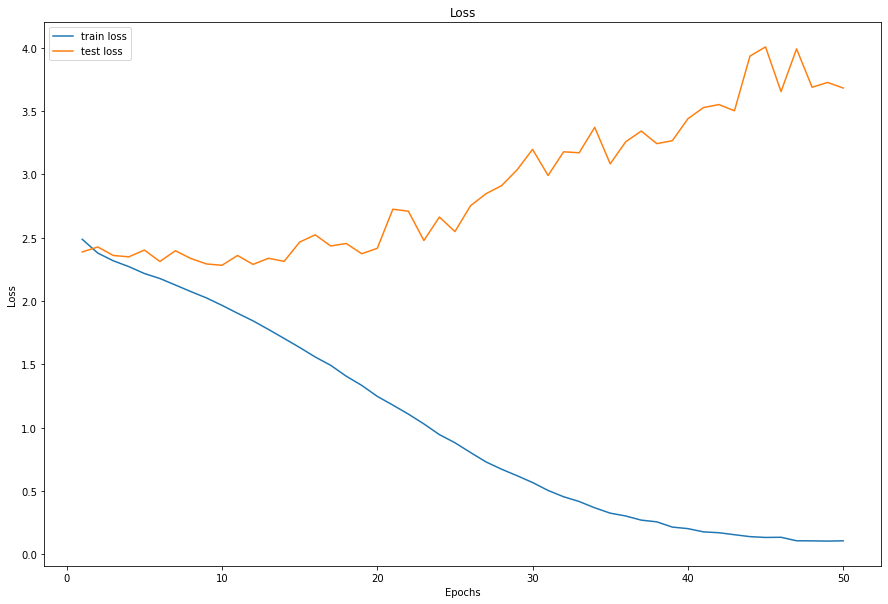

In [45]:
fig = plt.figure(figsize=(15,10))
ax = plt.axes()

plt.title("Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")

x = range(1, len(best_res['train_loss'])+1)
ax.plot(x, best_res['train_loss'], label='train loss')
ax.plot(x, best_res['test_loss'], label='test loss')

plt.legend()

## wykres zależności accuracy od numeru epoki

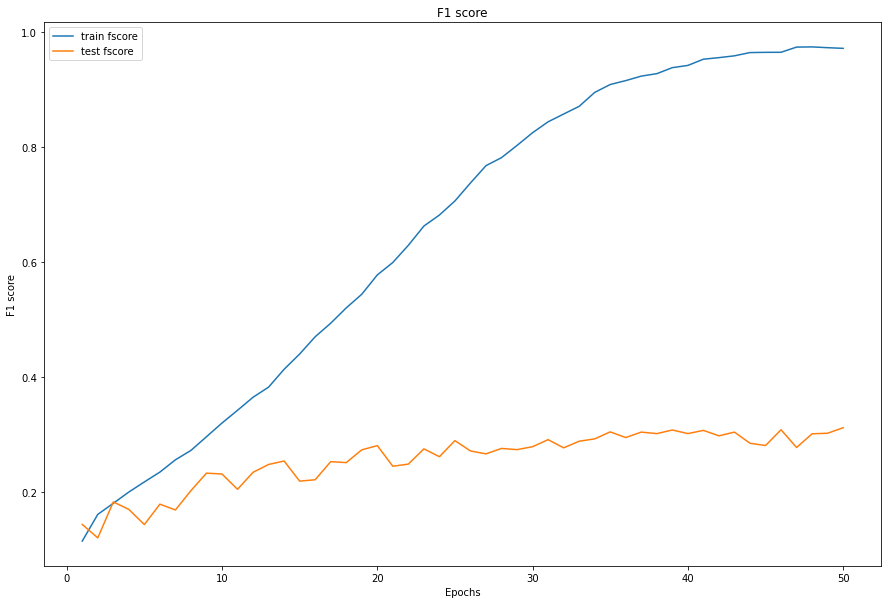

In [46]:
fig = plt.figure(figsize=(15,10))
ax = plt.axes()

plt.title("F1 score")
plt.xlabel("Epochs")
plt.ylabel("F1 score")

x = range(1, len(best_res['train_loss'])+1)
ax.plot(x, best_res['train_fscore'], label='train fscore')
ax.plot(x, best_res['test_fscore'], label='test fscore')

plt.legend()

In [13]:
train_ds = get_train_ds(x_train, y_train, 10)
cost_func = tf.keras.losses.SparseCategoricalCrossentropy()

model = ThreeLayerModel()
model.fit(train_ds = train_ds, 
            x_test = x_test,
            y_test = y_test,
            cost_func = cost_func,
            optimizer = tf.keras.optimizers.Adagrad,
            learning_rate = 0.01,
            epochs = 50)

100%|██████████| 50/50 [24:51<00:00, 29.82s/it]


## macierz pomyłek (confusion matrix)

[Text(0.5, 0, 'indo-islamic'),
 Text(1.5, 0, 'chinese'),
 Text(2.5, 0, 'art_deco'),
 Text(3.5, 0, 'secession'),
 Text(4.5, 0, 'romanesque'),
 Text(5.5, 0, 'byzantine'),
 Text(6.5, 0, 'russian_revival'),
 Text(7.5, 0, 'victorian_quenn_anne'),
 Text(8.5, 0, 'neoclassical'),
 Text(9.5, 0, 'postmodernism'),
 Text(10.5, 0, 'baroque'),
 Text(11.5, 0, 'achaemenid'),
 Text(12.5, 0, 'ancient'),
 Text(13.5, 0, 'renaissance')]

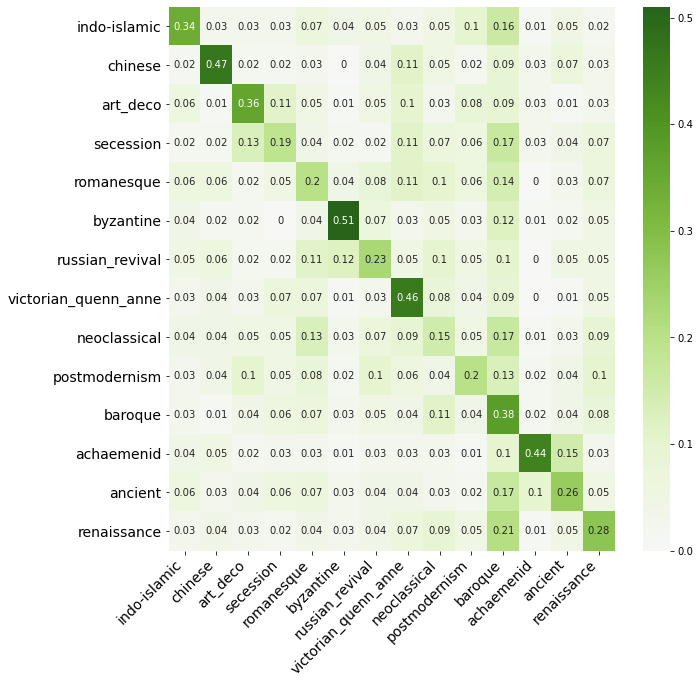

In [14]:
names = list(labels_mapping.keys())

test_dataset = (x_test, y_test)
y_pred = model.predict(x_test)
conf_matrix = tf.math.confusion_matrix(y_pred, y_test).numpy()
conf_matrix = np.around(conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis], decimals=2)

fig, ax = plt.subplots(figsize=(10,10))   
ax = sns.heatmap(conf_matrix, cmap="PiYG",
            annot=True, center=0)
ax.yaxis.set_ticklabels(names, rotation=0, ha='right', fontsize=14)
ax.xaxis.set_ticklabels(names, rotation=45, ha='right', fontsize=14)

## wizualizacja kilku przykładów na klasę, dla których model podejmowal złą decyzję

Predicted: 10 baroque
Should be: 4 romanesque


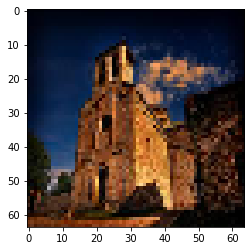

Predicted: 8 neoclassical
Should be: 13 renaissance


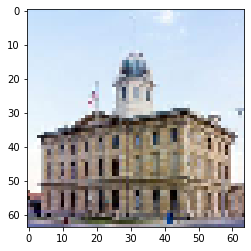

Predicted: 12 ancient
Should be: 11 achaemenid


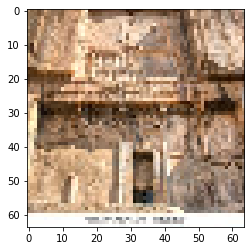

Predicted: 4 romanesque
Should be: 9 postmodernism


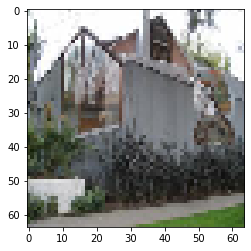

Predicted: 1 chinese
Should be: 7 victorian_quenn_anne


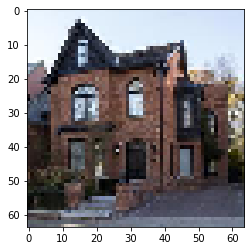

Predicted: 9 postmodernism
Should be: 7 victorian_quenn_anne


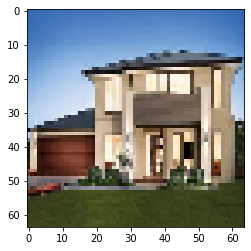

Predicted: 10 baroque
Should be: 7 victorian_quenn_anne


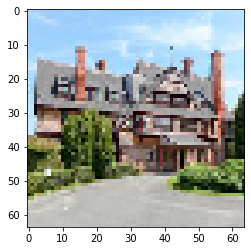

Predicted: 6 russian_revival
Should be: 12 ancient


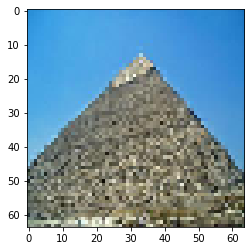

Predicted: 9 postmodernism
Should be: 10 baroque


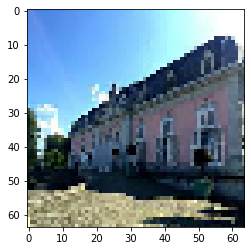

Predicted: 10 baroque
Should be: 0 indo-islamic


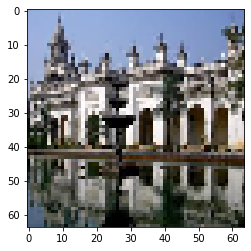

Predicted: 4 romanesque
Should be: 5 byzantine


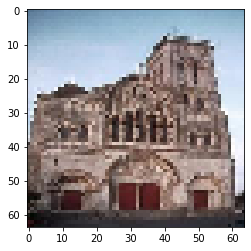

Predicted: 11 achaemenid
Should be: 12 ancient


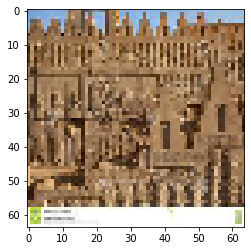

Predicted: 12 ancient
Should be: 6 russian_revival


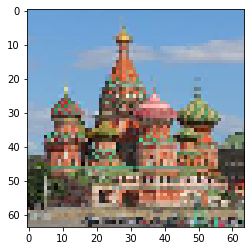

Predicted: 8 neoclassical
Should be: 6 russian_revival


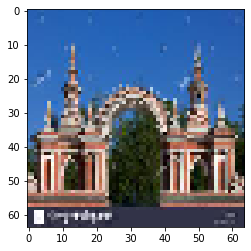

Predicted: 8 neoclassical
Should be: 2 art_deco


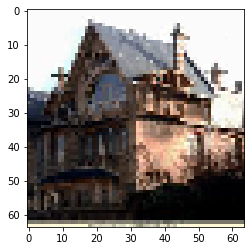

Predicted: 10 baroque
Should be: 6 russian_revival


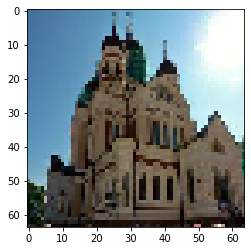

Predicted: 4 romanesque
Should be: 8 neoclassical


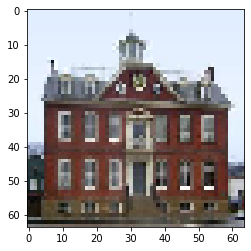

Predicted: 6 russian_revival
Should be: 5 byzantine


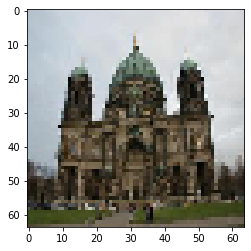

Predicted: 13 renaissance
Should be: 9 postmodernism


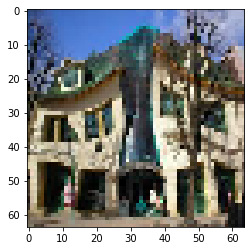

Predicted: 10 baroque
Should be: 8 neoclassical


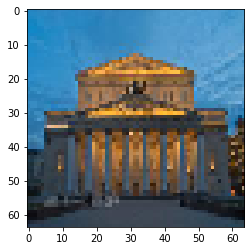

In [16]:
x_t = tf.reshape(x_test, [-1, 64, 64, 3])

preds = model.predict(x_test)
x_false = []
y_false = []
y_true = []
for i in range(len(preds)):
    if preds[i] != y_test[i][0]:
        x_false.append(x_t[i])
        y_false.append(preds[i])
        y_true.append(y_test[i][0])

for i in range(20):
    print(f"Predicted: {y_false[i]} {names[y_false[i]]}")
    print(f"Should be: {y_true[i]} {names[y_true[i]]}")
    plt.imshow(x_false[i])
    plt.show()

## Podsumowanie

W porównaniu do wyników z poprzedniej części zadania (lab 1.1), dodano trzecią warstwę do sieci, zmieniono funkcji aktywacji wag na random_uniform i biasów na random_glorot, zwiększono liczbę epok uczenia do 50, zamieniono funkcję aktywacji na Adagrad ze współczynnikiem uczenia 0.01, i zmniejszono liczbę paczek do 10. Wynikiem wprowadzonych zmian jest zwiększenie miary fscore do poziomu ~30% i zwiększenie czasu uczenia sieci do ~22 minut.

Niestety, anliza dlaczego model mógł źle sklasyfikować obraz na podstawie wizualizacji kilku przypadków, jest nadal nieosiąglane, z powodu braku wiedzy na temat rodzajów architektonicznych.